<a href="https://colab.research.google.com/github/mahuthu/Omdena-Liberia-Chapter/blob/main/EDA_on_LBGC81FL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Installing required libraries

In [ ]:
!pip install contextily

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.6/20.6 MB 40.2 MB/s eta 0:00:00


# Importing the required libraries

In [ ]:
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import contextily as ctx

#Reading the shapefiles LBGE81FL.shp

In [ ]:
gdf = gpd.read_file("/content/drive/MyDrive/Malaria_prediction/LB_2022_MIS_02262024_207_206552/LBGE81FL/LBGE81FL.shp")

In [ ]:
gdf.head()

,DHSID,DHSCC,DHSYEAR,DHSCLUST,CCFIPS,ADM1FIPS,ADM1FIPSNA,ADM1SALBNA,ADM1SALBCO,ADM1DHS,...,DHSREGCO,DHSREGNA,SOURCE,URBAN_RURA,LATNUM,LONGNUM,ALT_GPS,ALT_DEM,DATUM,geometry
0,LB202200000001,LB,2022.0,1.0,LI,NULL,NULL,NULL,NULL,9999.0,...,1.0,Greater Monrovia,GPS,U,6.382679,-10.785782,9999.0,8.0,WGS84,POINT (-10.78578 6.38268)
1,LB202200000002,LB,2022.0,2.0,LI,NULL,NULL,NULL,NULL,9999.0,...,1.0,Greater Monrovia,GPS,U,6.374213,-10.789500,9999.0,8.0,WGS84,POINT (-10.78950 6.37421)
2,LB202200000003,LB,2022.0,3.0,LI,NULL,NULL,NULL,NULL,9999.0,...,1.0,Greater Monrovia,GPS,U,6.336064,-10.778938,9999.0,10.0,WGS84,POINT (-10.77894 6.33606)
3,LB202200000004,LB,2022.0,4.0,LI,NULL,NULL,NULL,NULL,9999.0,...,1.0,Greater Monrovia,GPS,U,6.356426,-10.769316,9999.0,7.0,WGS84,POINT (-10.76932 6.35643)
4,LB202200000005,LB,2022.0,5.0,LI,NULL,NULL,NULL,NULL,9999.0,...,1.0,Greater Monrovia,GPS,U,6.331143,-10.790253,9999.0,5.0,WGS84,POINT (-10.79025 6.33114)


In [ ]:
gdf.columns

Index(['DHSID', 'DHSCC', 'DHSYEAR', 'DHSCLUST', 'CCFIPS', 'ADM1FIPS',
       'ADM1FIPSNA', 'ADM1SALBNA', 'ADM1SALBCO', 'ADM1DHS', 'ADM1NAME',
       'DHSREGCO', 'DHSREGNA', 'SOURCE', 'URBAN_RURA', 'LATNUM', 'LONGNUM',
       'ALT_GPS', 'ALT_DEM', 'DATUM', 'geometry'],
      dtype='object')

In [ ]:
gdf['URBAN_RURA'].unique()

array(['U', 'R'], dtype=object)

#Reading the geospatial covariate files LBGC81FL.csv

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Malaria_prediction/LB_2022_MIS_02262024_207_206552/LBGC81FL/LBGC81FL/LBGC81FL.csv")

In [ ]:
df.head()

,DHSID,GPS_Dataset,DHSCC,DHSYEAR,DHSCLUST,SurveyID,All_Population_Count_2000,All_Population_Count_2005,All_Population_Count_2010,All_Population_Count_2015,...,UN_Population_Density_2000,UN_Population_Density_2005,UN_Population_Density_2010,UN_Population_Density_2015,UN_Population_Density_2020,Wet_Days_2000,Wet_Days_2005,Wet_Days_2010,Wet_Days_2015,Wet_Days_2020
0,LB202200000001,LBGE81FL,LB,2022,1,LB2022MIS,27352.85742,42677.08984,34296.13672,63815.57422,...,1641.004272,1976.934082,2543.622314,3068.852051,3669.679443,14.706976,14.093117,15.341501,14.662558,14.191185
1,LB202200000002,LBGE81FL,LB,2022,2,LB2022MIS,88366.49219,108027.96090,118025.37500,169188.75000,...,3187.221191,3839.676514,4940.319824,5960.441406,7127.391602,14.688475,14.222891,15.457699,14.585359,14.171819
2,LB202200000003,LBGE81FL,LB,2022,3,LB2022MIS,88366.49219,108027.96090,118025.37500,169188.75000,...,3187.221191,3839.676514,4940.319824,5960.441406,7127.391602,14.688475,14.222891,15.457699,14.585359,14.171819
3,LB202200000004,LBGE81FL,LB,2022,4,LB2022MIS,88366.49219,108027.96090,118025.37500,169188.75000,...,3187.221191,3839.676514,4940.319824,5960.441406,7127.391602,14.688475,14.222891,15.457699,14.585359,14.171819
4,LB202200000005,LBGE81FL,LB,2022,5,LB2022MIS,78293.33594,91716.04688,107449.17190,122725.70310,...,3187.220947,3839.676270,4940.320313,5960.440918,7127.390625,14.669973,14.352665,15.573897,14.508160,14.152452


In [ ]:
columns = list(df.columns)

In [ ]:
columns

['DHSID',
 'GPS_Dataset',
 'DHSCC',
 'DHSYEAR',
 'DHSCLUST',
 'SurveyID',
 'All_Population_Count_2000',
 'All_Population_Count_2005',
 'All_Population_Count_2010',
 'All_Population_Count_2015',
 'All_Population_Count_2020',
 'Aridity_2000',
 'Aridity_2005',
 'Aridity_2010',
 'Aridity_2015',
 'Aridity_2020',
 'Day_Land_Surface_Temp_2000',
 'Day_Land_Surface_Temp_2005',
 'Day_Land_Surface_Temp_2010',
 'Day_Land_Surface_Temp_2015',
 'Day_Land_Surface_Temp_2020',
 'Diurnal_Temperature_Range_2000',
 'Diurnal_Temperature_Range_2005',
 'Diurnal_Temperature_Range_2010',
 'Diurnal_Temperature_Range_2015',
 'Diurnal_Temperature_Range_2020',
 'Drought_Episodes',
 'Elevation',
 'Enhanced_Vegetation_Index_2000',
 'Enhanced_Vegetation_Index_2005',
 'Enhanced_Vegetation_Index_2010',
 'Enhanced_Vegetation_Index_2015',
 'Enhanced_Vegetation_Index_2020',
 'Frost_Days_2000',
 'Frost_Days_2005',
 'Frost_Days_2010',
 'Frost_Days_2015',
 'Frost_Days_2020',
 'Global_Human_Footprint',
 'Growing_Season_Length'

# Combining data from files LBGE81FL.shp and LBGC81FL.csv

In [ ]:
gdf_combined = pd.concat([gdf,df],axis=1)

In [ ]:
gdf_combined.shape

(150, 156)

In [ ]:
gdf_combined.describe()

,DHSYEAR,DHSCLUST,ADM1DHS,DHSREGCO,LATNUM,LONGNUM,ALT_GPS,ALT_DEM,DHSYEAR,DHSCLUST,...,UN_Population_Density_2000,UN_Population_Density_2005,UN_Population_Density_2010,UN_Population_Density_2015,UN_Population_Density_2020,Wet_Days_2000,Wet_Days_2005,Wet_Days_2010,Wet_Days_2015,Wet_Days_2020
count,150.0,150.000000,150.0,150.000000,150.000000,150.000000,150.0,150.000000,150.0,150.000000,...,150.000000,150.000000,150.000000,150.000000,150.000000,150.000000,150.000000,150.000000,150.000000,150.000000
mean,2022.0,75.500000,9999.0,3.500000,6.234196,-9.662766,9999.0,122.580000,2022.0,75.500000,...,556.554174,666.576409,853.105418,1024.309141,1219.492806,14.219087,14.054938,15.502925,13.476785,13.857543
std,0.0,43.445368,0.0,1.713547,0.918448,1.134640,0.0,133.053114,0.0,43.445368,...,1140.213034,1374.206379,1768.934466,2135.218019,2554.489670,0.580967,0.661470,0.633518,1.072186,0.474247
min,2022.0,1.000000,9999.0,1.000000,4.379297,-11.361060,9999.0,0.000000,2022.0,1.000000,...,3.703621,4.209942,5.110974,5.818274,6.564679,12.569227,12.135798,14.290169,11.530925,12.441901
25%,2022.0,38.250000,9999.0,2.000000,5.705349,-10.699626,9999.0,14.250000,2022.0,38.250000,...,19.265139,21.710139,25.023400,27.231499,29.371471,13.870532,13.654886,15.075325,12.635368,13.579267
50%,2022.0,75.500000,9999.0,3.500000,6.315335,-9.941604,9999.0,72.500000,2022.0,75.500000,...,32.213713,35.677240,43.136772,49.447210,54.676580,14.403161,14.251755,15.604392,13.243967,13.997280
75%,2022.0,112.750000,9999.0,5.000000,6.785699,-8.530164,9999.0,216.000000,2022.0,112.750000,...,95.996582,112.120781,139.823589,159.205215,185.096027,14.686512,14.547835,15.928383,14.430961,14.180065
max,2022.0,150.000000,9999.0,6.000000,8.472160,-7.622189,9999.0,557.000000,2022.0,150.000000,...,3187.221191,3839.676758,4940.320313,5960.441406,7127.391602,14.943142,14.932703,16.944809,15.386003,14.492428


In [ ]:
null_values = gdf_combined.isnull().sum()

In [ ]:
non_zero_columns = null_values[null_values != 0].index

In [ ]:
non_zero_columns

Index(['Drought_Episodes', 'Global_Human_Footprint', 'Rainfall_2000',
       'Rainfall_2005', 'Rainfall_2010', 'Rainfall_2015'],
      dtype='object')

In [ ]:
df[non_zero_columns].describe()

,Drought_Episodes,Global_Human_Footprint,Rainfall_2000,Rainfall_2005,Rainfall_2010,Rainfall_2015
count,75.00000,149.000000,145.000000,145.000000,145.000000,145.000000
mean,2.24000,35.030591,2654.015379,2771.034628,3530.746338,2350.177924
std,0.81936,11.910268,579.941846,660.708347,829.527924,497.107376
min,2.00000,10.085950,1824.169678,1652.143921,2203.855469,1564.074341
25%,2.00000,28.780991,2214.021973,2292.542236,2832.073730,1993.759888
50%,2.00000,33.330757,2515.581787,2660.005859,3420.962158,2279.378906
75%,2.00000,41.539223,2871.508545,3183.231201,3997.549072,2631.245605
max,5.00000,68.276192,4065.887695,4167.133301,5240.718262,3427.000000


<Axes: >

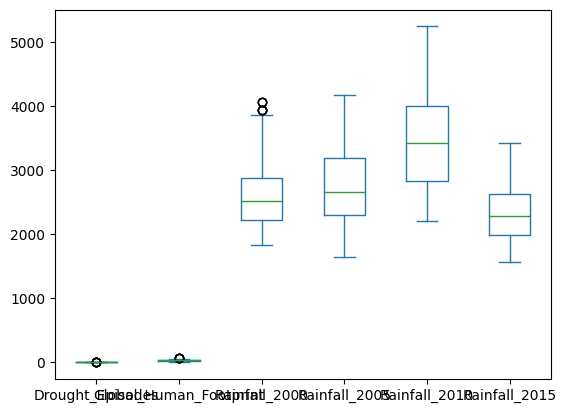

In [ ]:
df[non_zero_columns].plot.box()

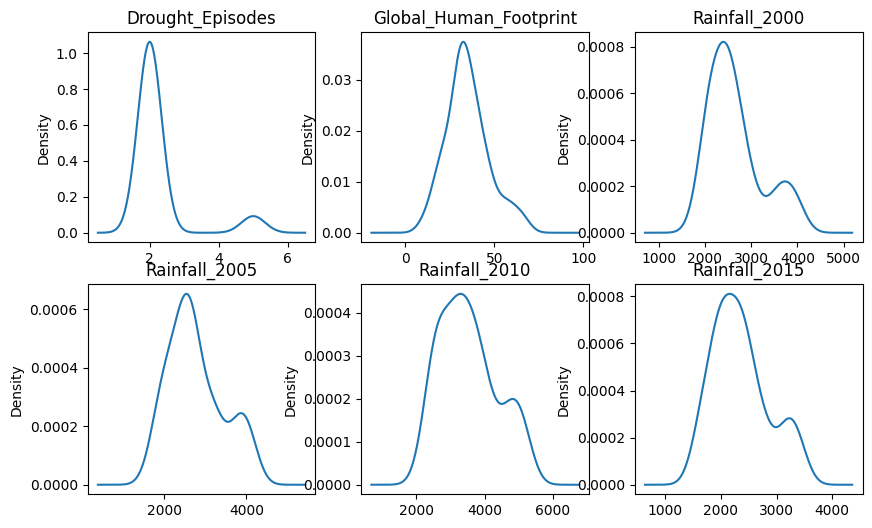

In [ ]:
#Check the distribution of the columns with NA values
for i, col in enumerate(non_zero_columns):
  plt.subplot(2,3,i+1)
  df[col].plot(kind='kde',figsize=(10,6))
  plt.title(f"{col}")

plt.show()


In [ ]:
#checking the number of null values in each column
for column in gdf_combined.columns:
    print(f"{column}: {gdf_combined[column].isnull().sum()}")

DHSID: DHSID    0
DHSID    0
dtype: int64
DHSCC: DHSCC    0
DHSCC    0
dtype: int64
DHSYEAR: DHSYEAR    0
DHSYEAR    0
dtype: int64
DHSCLUST: DHSCLUST    0
DHSCLUST    0
dtype: int64
CCFIPS: 0
ADM1FIPS: 0
ADM1FIPSNA: 0
ADM1SALBNA: 0
ADM1SALBCO: 0
ADM1DHS: 0
ADM1NAME: 0
DHSREGCO: 0
DHSREGNA: 0
SOURCE: 0
URBAN_RURA: 0
LATNUM: 0
LONGNUM: 0
ALT_GPS: 0
ALT_DEM: 0
DATUM: 0
geometry: 0
DHSID: DHSID    0
DHSID    0
dtype: int64
GPS_Dataset: 0
DHSCC: DHSCC    0
DHSCC    0
dtype: int64
DHSYEAR: DHSYEAR    0
DHSYEAR    0
dtype: int64
DHSCLUST: DHSCLUST    0
DHSCLUST    0
dtype: int64
SurveyID: 0
All_Population_Count_2000: 0
All_Population_Count_2005: 0
All_Population_Count_2010: 0
All_Population_Count_2015: 0
All_Population_Count_2020: 0
Aridity_2000: 0
Aridity_2005: 0
Aridity_2010: 0
Aridity_2015: 0
Aridity_2020: 0
Day_Land_Surface_Temp_2000: 0
Day_Land_Surface_Temp_2005: 0
Day_Land_Surface_Temp_2010: 0
Day_Land_Surface_Temp_2015: 0
Day_Land_Surface_Temp_2020: 0
Diurnal_Temperature_Range_2000: 0

In [ ]:
gdf_combined.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 150 entries, 0 to 149
Columns: 156 entries, DHSID to Wet_Days_2020
dtypes: float64(131), geometry(1), int64(8), object(16)
memory usage: 182.9+ KB


#HEALTH EDA

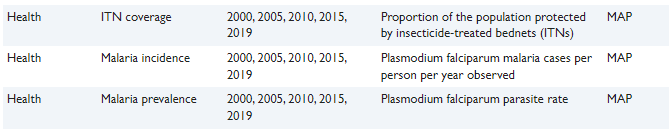

* Malaria Incidence : Number of clinical cases of Plasmodium falciparum malaria per person.

* Malaria Prevalence : Parasite rate of plasmodium falciparum (PfPR) in children between the ages of 2 and 10 years old.


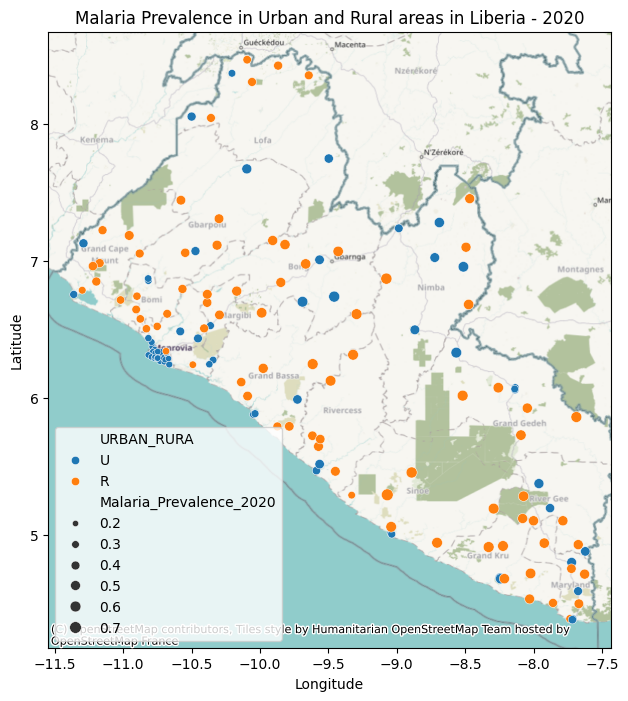

In [ ]:
plt.figure(figsize=(10, 8))
ax = sns.scatterplot(x='LONGNUM', y='LATNUM', data=gdf_combined,hue='URBAN_RURA',size='Malaria_Prevalence_2020')
plt.title('Malaria Prevalence in Urban and Rural areas in Liberia - 2020')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
ctx.add_basemap(ax=ax, crs=gdf.crs)
plt.show()


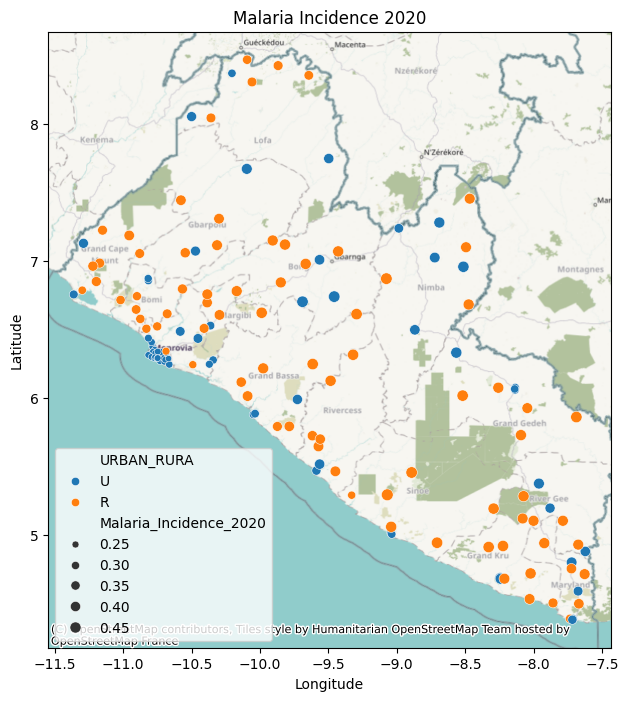

In [ ]:
# Geographic distribution

plt.figure(figsize=(10, 8))
ax = sns.scatterplot(x='LONGNUM', y='LATNUM', data=gdf_combined, size='Malaria_Incidence_2020',hue='URBAN_RURA')
plt.title('Malaria Incidence 2020')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
ctx.add_basemap(ax=ax, crs=gdf_combined.crs)
plt.show()

The average number of clinical cases of Plasmodium falciparum malaria per person per year at the DHS survey cluster location.

A clinical case is defined as a malaria-attributable febrile episode (body temperature above 37.5 C), typically accompanied by headaches, nausea, excess sweating and/or fatigue, censored by a 30-day window (i.e., multiple bouts of symptoms occurring within the same 30-day period are counted as a single episode).

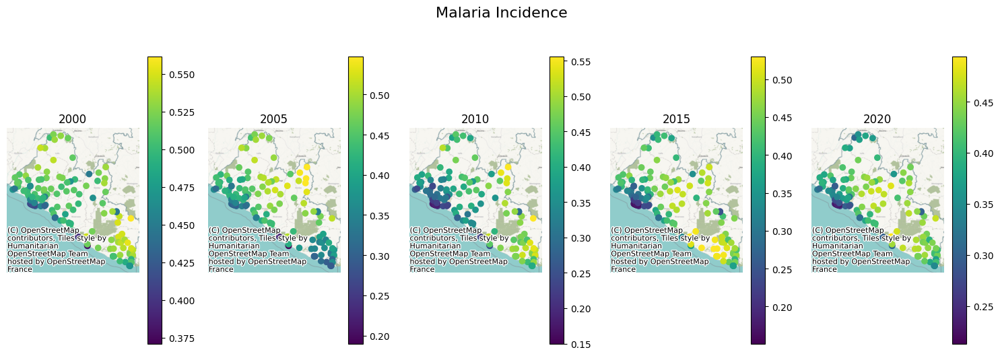

In [ ]:
fig, ax = plt.subplots(1, len(columns[56:61]) ,figsize=(15, 5))

for i, column in enumerate(columns[56:61]):
    gdf_combined.plot(column=column, cmap='viridis', ax=ax[i], legend=True)
    ctx.add_basemap(ax=ax[i], crs=gdf.crs)
    ax[i].set_title(column.split('_')[2])
    ax[i].axis('off')

plt.suptitle('Malaria Incidence', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

In [ ]:
malaria_columns = ['DHSREGNA', 'Malaria_Incidence_2000', 'Malaria_Incidence_2005', 'Malaria_Incidence_2010', 'Malaria_Incidence_2015', 'Malaria_Incidence_2020']
malaria_data = gdf_combined[malaria_columns]
malaria_data

,DHSREGNA,Malaria_Incidence_2000,Malaria_Incidence_2005,Malaria_Incidence_2010,Malaria_Incidence_2015,Malaria_Incidence_2020
0,Greater Monrovia,0.423700,0.306112,0.188176,0.181560,0.246674
1,Greater Monrovia,0.389680,0.256955,0.149609,0.150737,0.213113
2,Greater Monrovia,0.389680,0.256955,0.149609,0.150737,0.213113
3,Greater Monrovia,0.389680,0.256955,0.149609,0.150737,0.213113
4,Greater Monrovia,0.409951,0.299439,0.173099,0.161435,0.226514
...,...,...,...,...,...,...
145,South Eastern B,0.543129,0.365881,0.477532,0.498394,0.440358
146,South Eastern B,0.537308,0.346868,0.439948,0.421503,0.392114
147,South Eastern B,0.554246,0.407818,0.535812,0.476530,0.439801
148,South Eastern B,0.541882,0.378195,0.516183,0.424111,0.404691


<Axes: xlabel='DHSREGNA'>

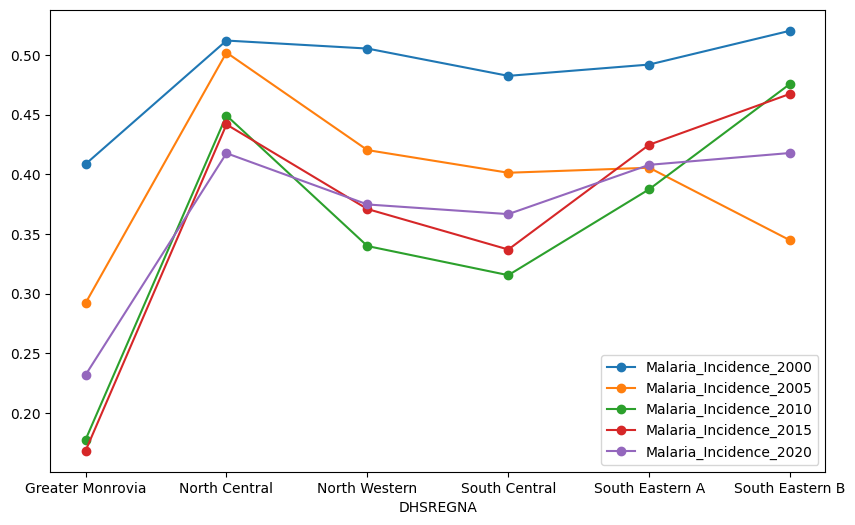

In [ ]:
malaria_data.groupby('DHSREGNA').mean().plot.line(figsize=(10,6),marker='o')

In [ ]:
malaria_data.groupby('DHSREGNA').mean()

,Malaria_Incidence_2000,Malaria_Incidence_2005,Malaria_Incidence_2010,Malaria_Incidence_2015,Malaria_Incidence_2020
DHSREGNA,,,,,
Greater Monrovia,0.408532,0.292084,0.177609,0.168343,0.231874
North Central,0.512055,0.501970,0.449226,0.441731,0.417637
North Western,0.505348,0.420271,0.339846,0.370877,0.374702
South Central,0.482463,0.401272,0.315440,0.336937,0.366615
South Eastern A,0.491933,0.405477,0.387463,0.424750,0.407916
South Eastern B,0.520288,0.344636,0.475774,0.467412,0.417831


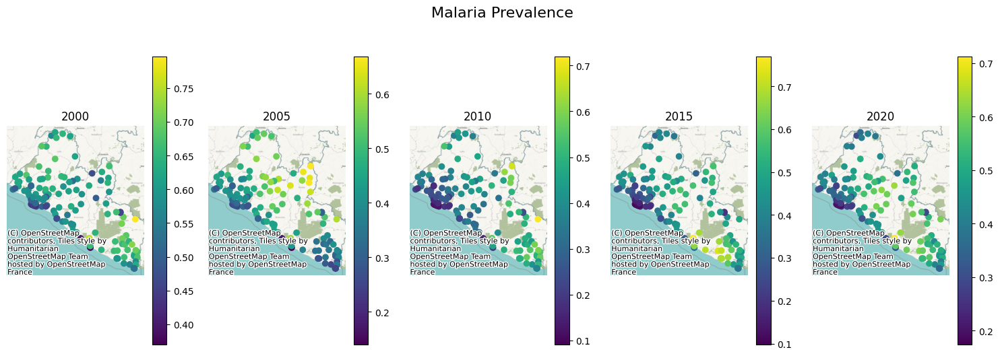

In [ ]:
fig, ax = plt.subplots(1, len(columns[61:66]) ,figsize=(15, 5))

for i, column in enumerate(columns[61:66]):
    gdf_combined.plot(column=column, cmap='viridis', ax=ax[i], legend=True)
    ctx.add_basemap(ax=ax[i], crs=gdf.crs)
    ax[i].set_title(column.split('_')[2])
    ax[i].axis('off')

plt.suptitle('Malaria Prevalence', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

In [ ]:
malaria_prevalence_columns = ['DHSREGNA', 'Malaria_Prevalence_2000',
 'Malaria_Prevalence_2005',
 'Malaria_Prevalence_2010',
 'Malaria_Prevalence_2015',
 'Malaria_Prevalence_2020']
malaria_prevalence_data = gdf_combined[malaria_prevalence_columns]

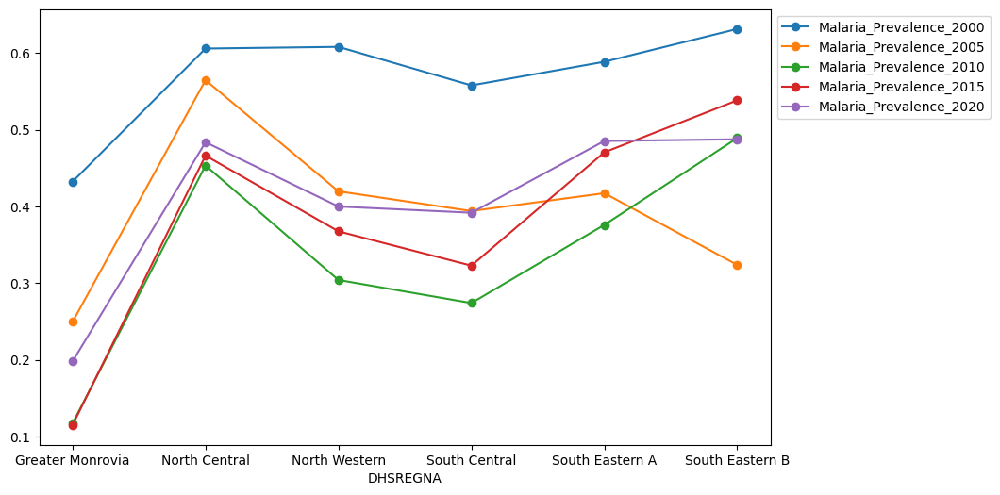

In [ ]:
ax = malaria_prevalence_data.groupby('DHSREGNA').mean().plot.line(figsize=(10,6),marker='o')
ax.legend(loc=2, bbox_to_anchor=(1.0,1.0))

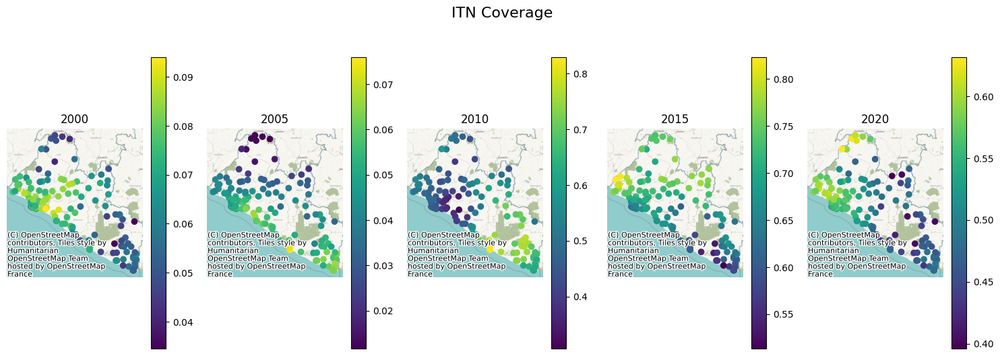

In [ ]:
fig, ax = plt.subplots(1, len(columns[41:46]) ,figsize=(15, 5))

for i, column in enumerate(columns[41:46]):
    gdf_combined.plot(column=column, cmap='viridis', ax=ax[i], legend=True)
    ctx.add_basemap(ax=ax[i], crs=gdf.crs)
    ax[i].set_title(column.split('_')[2])
    ax[i].axis('off')

plt.suptitle('ITN Coverage', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

In [ ]:
itn_columns = ['DHSREGNA', 'ITN_Coverage_2000',
 'ITN_Coverage_2005',
 'ITN_Coverage_2010',
 'ITN_Coverage_2015',
 'ITN_Coverage_2020']
itn_data = gdf_combined[itn_columns]

<Axes: xlabel='DHSREGNA'>

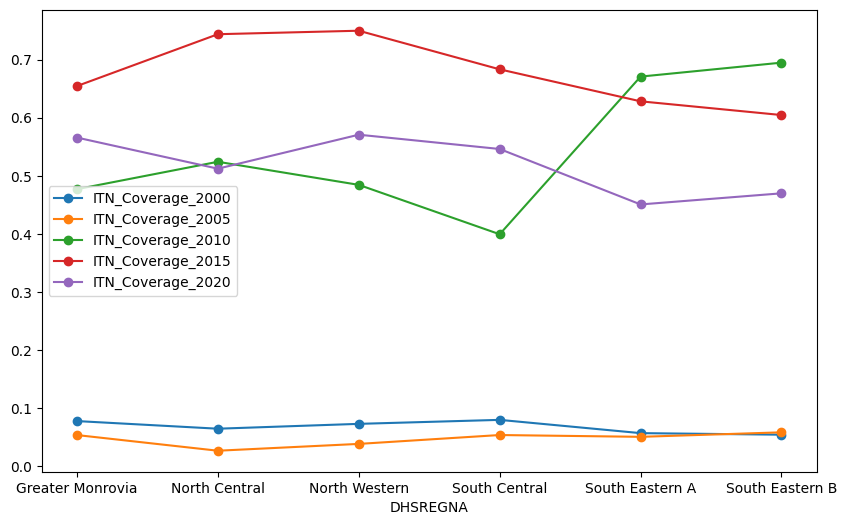

In [ ]:
itn_data.groupby('DHSREGNA').mean().plot.line(figsize=(10,6),marker='o')

In [ ]:
gdf_combined.groupby('URBAN_RURA')[['Malaria_Prevalence_2020','Malaria_Incidence_2020','ITN_Coverage_2020']].mean().sort_values(by='Malaria_Incidence_2020',ascending=False)

,Malaria_Prevalence_2020,Malaria_Incidence_2020,ITN_Coverage_2020
URBAN_RURA,,,
R,0.477528,0.413104,0.512694
U,0.325748,0.318159,0.526872


In [ ]:
gdf_combined.groupby('DHSREGNA')[['Malaria_Prevalence_2020','Malaria_Incidence_2020','ITN_Coverage_2020']].mean().sort_values(by='Malaria_Prevalence_2020',ascending=False)

,Malaria_Prevalence_2020,Malaria_Incidence_2020,ITN_Coverage_2020
DHSREGNA,,,
South Eastern B,0.487563,0.417831,0.469819
South Eastern A,0.485323,0.407916,0.450675
North Central,0.483713,0.417637,0.512224
North Western,0.399881,0.374702,0.570709
South Central,0.391773,0.366615,0.546107
Greater Monrovia,0.198002,0.231874,0.565760


# Climate EDA

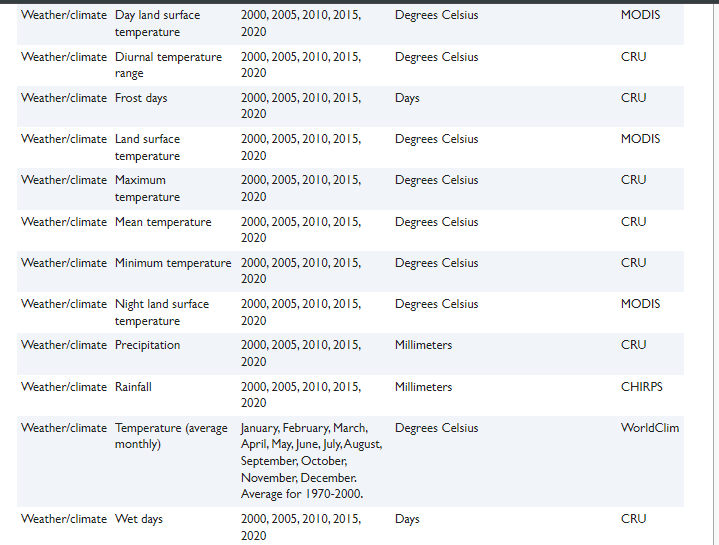

* Wet Days(Mean): The average number of days per month receiving ≥0.1 mm precipitation at the DHS survey cluster location.

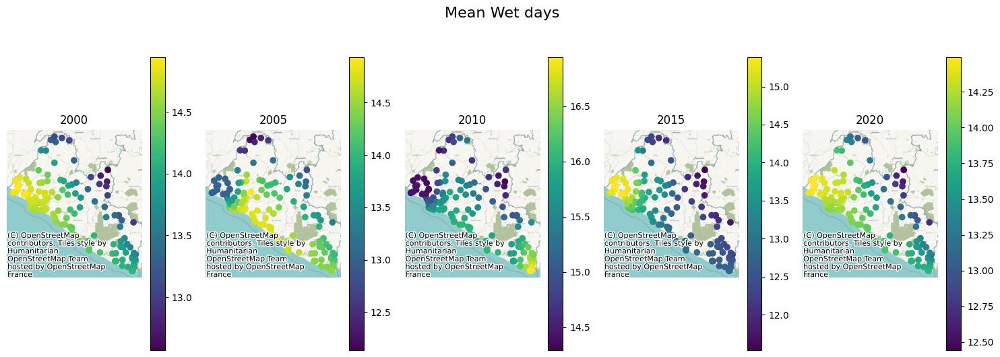

In [ ]:
fig, ax = plt.subplots(1, len(columns[130:135]) ,figsize=(15, 5))

for i, column in enumerate(columns[130:135]):
    gdf_combined.plot(column=column, cmap='viridis', ax=ax[i], legend=True)
    ctx.add_basemap(ax=ax[i], crs=gdf.crs)
    ax[i].set_title(column.split('_')[2])
    ax[i].axis('off')

plt.suptitle('Mean Wet days', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

In [ ]:
wet_days_columns = ['DHSREGNA', 'Wet_Days_2000',
 'Wet_Days_2005',
 'Wet_Days_2010',
 'Wet_Days_2015',
 'Wet_Days_2020']
wet_days_data = gdf_combined[wet_days_columns]

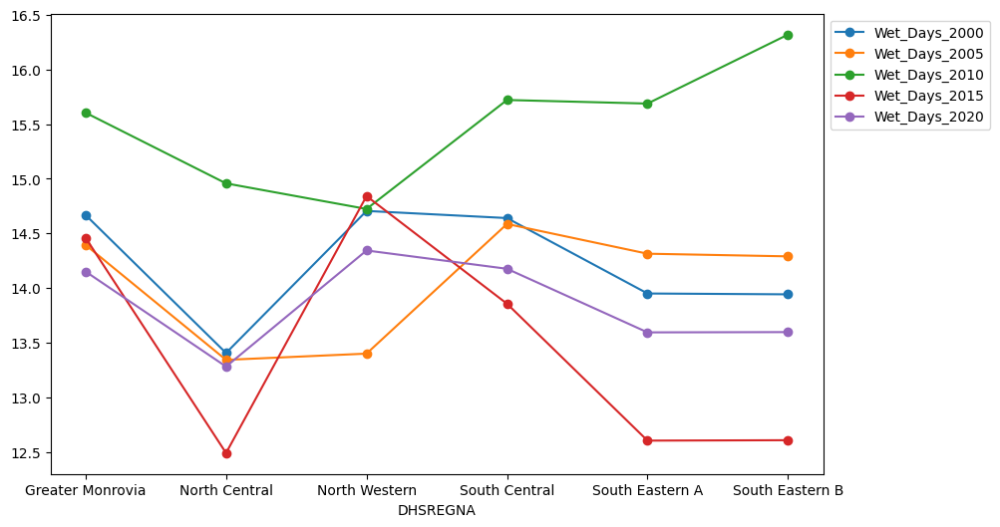

In [ ]:
ax = wet_days_data.groupby('DHSREGNA').mean().plot.line(figsize=(10,6),marker='o')
ax.legend(loc=2, bbox_to_anchor=(1.0,1.0))

In [ ]:
gdf_combined.groupby('URBAN_RURA')[wet_days_columns].mean()

<ipython-input-129-b9bab099f313>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  gdf_combined.groupby('URBAN_RURA')[wet_days_columns].mean()


,Wet_Days_2000,Wet_Days_2005,Wet_Days_2010,Wet_Days_2015,Wet_Days_2020
URBAN_RURA,,,,,
R,14.174879,14.000684,15.499049,13.346316,13.838460
U,14.270985,14.118627,15.507475,13.629945,13.879945


In [ ]:
gdf_combined.groupby('DHSREGNA')[wet_days_columns].mean()

<ipython-input-128-875a1b2f4f7e>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  gdf_combined.groupby('DHSREGNA')[wet_days_columns].mean()


,Wet_Days_2000,Wet_Days_2005,Wet_Days_2010,Wet_Days_2015,Wet_Days_2020
DHSREGNA,,,,,
Greater Monrovia,14.668827,14.395042,15.605054,14.460695,14.151429
North Central,13.405884,13.342855,14.958219,12.490408,13.281526
North Western,14.705963,13.400029,14.723919,14.841895,14.344167
South Central,14.640707,14.586851,15.721572,13.856352,14.176524
South Eastern A,13.950447,14.314575,15.688730,12.603744,13.594519
South Eastern B,13.942697,14.290276,16.320053,12.607618,13.597094


* Average monthly temperature: Average temperature for months January to December in degrees Celsius.

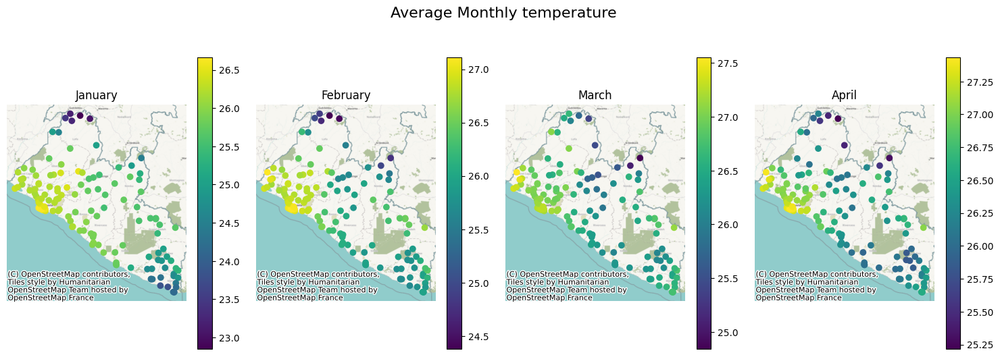

In [ ]:
fig, ax = plt.subplots(1, len(columns[102:106]) ,figsize=(15, 5))

for i, column in enumerate(columns[102:106]):
    gdf_combined.plot(column=column, cmap='viridis', ax=ax[i], legend=True)
    ctx.add_basemap(ax=ax[i], crs=gdf.crs)
    ax[i].set_title(column.split('_')[1])
    ax[i].axis('off')

plt.suptitle('Average Monthly temperature', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

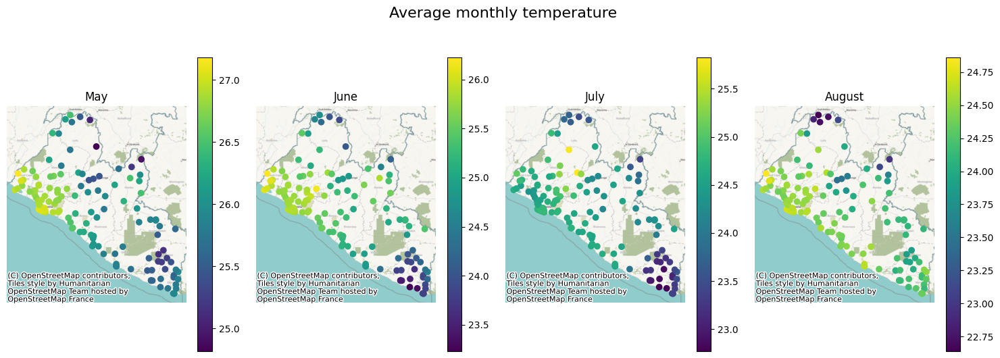

In [ ]:
fig, ax = plt.subplots(1, len(columns[106:110]) ,figsize=(15, 5))

for i, column in enumerate(columns[106:110]):
    gdf_combined.plot(column=column, cmap='viridis', ax=ax[i], legend=True)
    ctx.add_basemap(ax=ax[i], crs=gdf.crs)
    ax[i].set_title(column.split('_')[1])
    ax[i].axis('off')

plt.suptitle('Average monthly temperature', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

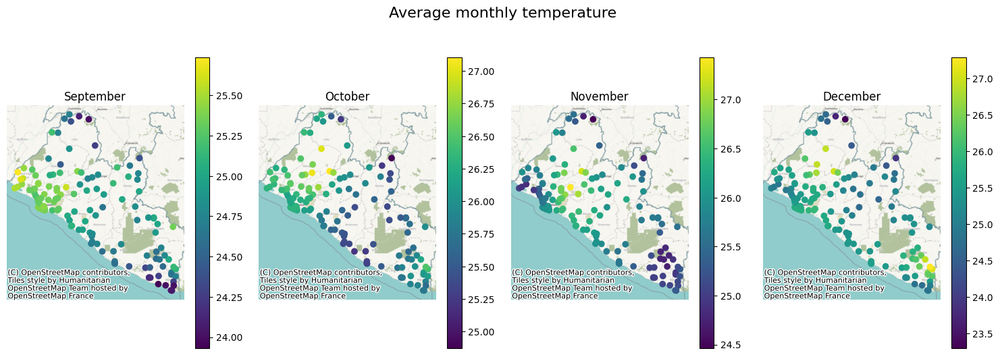

In [ ]:
fig, ax = plt.subplots(1, len(columns[110:114]) ,figsize=(15, 5))

for i, column in enumerate(columns[110:114]):
    gdf_combined.plot(column=column, cmap='viridis', ax=ax[i], legend=True)
    ctx.add_basemap(ax=ax[i], crs=gdf.crs)
    ax[i].set_title(column.split('_')[1])
    ax[i].axis('off')

plt.suptitle('Average monthly temperature', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

In [ ]:
month_temp_columns = ['DHSREGNA', 'Temperature_January',
 'Temperature_February',
 'Temperature_March',
 'Temperature_April',
 'Temperature_May',
 'Temperature_June',
 'Temperature_July',
 'Temperature_August',
 'Temperature_September',
 'Temperature_October',
 'Temperature_November',
 'Temperature_December']
month_temp_data = gdf_combined[month_temp_columns]

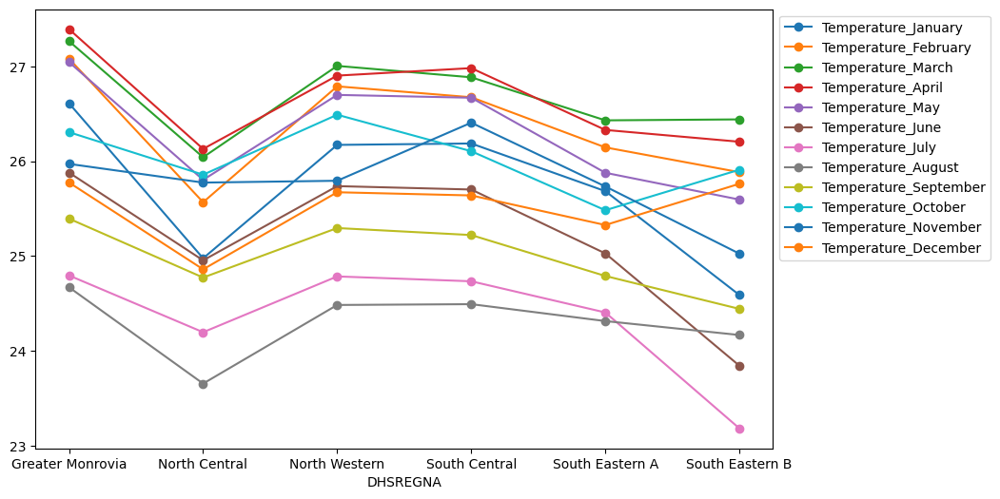

In [ ]:
ax = month_temp_data.groupby('DHSREGNA').mean().plot.line(figsize=(10,6),marker='o')
ax.legend(loc=2, bbox_to_anchor=(1.0,1.0))

<ipython-input-134-86b8b0e55680>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  gdf_combined.groupby('URBAN_RURA')[month_temp_columns].mean().plot.bar()


<Axes: xlabel='URBAN_RURA'>

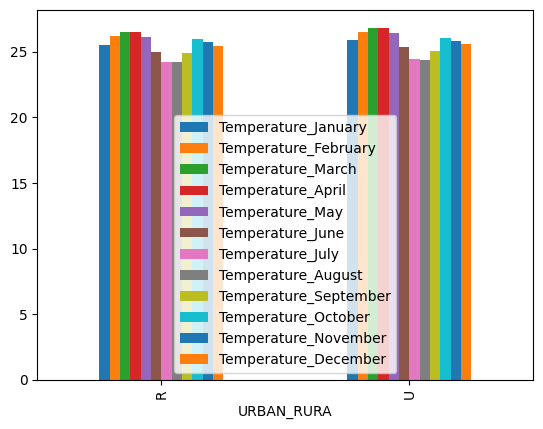

In [ ]:
gdf_combined.groupby('URBAN_RURA')[month_temp_columns].mean().plot.bar()

In [ ]:
gdf_combined.groupby('DHSREGNA')[month_temp_columns].mean()

<ipython-input-130-38e584e8e5fb>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  gdf_combined.groupby('DHSREGNA')[month_temp_columns].mean()


,Temperature_January,Temperature_February,Temperature_March,Temperature_April,Temperature_May,Temperature_June,Temperature_July,Temperature_August,Temperature_September,Temperature_October,Temperature_November,Temperature_December
DHSREGNA,,,,,,,,,,,,
Greater Monrovia,26.610538,27.080966,27.265848,27.392160,27.045041,25.879464,24.794614,24.669956,25.393783,26.305982,25.971408,25.774846
North Central,24.975760,25.567172,26.041481,26.129350,25.802996,24.953981,24.196011,23.654316,24.772771,25.857619,25.774295,24.859462
North Western,26.171912,26.789521,27.005110,26.902619,26.699186,25.737046,24.784496,24.483430,25.294863,26.489974,25.793653,25.672512
South Central,26.186736,26.674429,26.884924,26.981648,26.669395,25.701225,24.733447,24.491996,25.221069,26.105183,26.406171,25.638878
South Eastern A,25.684133,26.145545,26.430751,26.329695,25.877736,25.027196,24.404432,24.313676,24.789386,25.482589,25.733438,25.326724
South Eastern B,24.588392,25.884031,26.440953,26.205207,25.595212,23.842693,23.181600,24.166715,24.442187,25.910007,25.024649,25.761666


The average annual rainfall at the DHS survey cluster location.

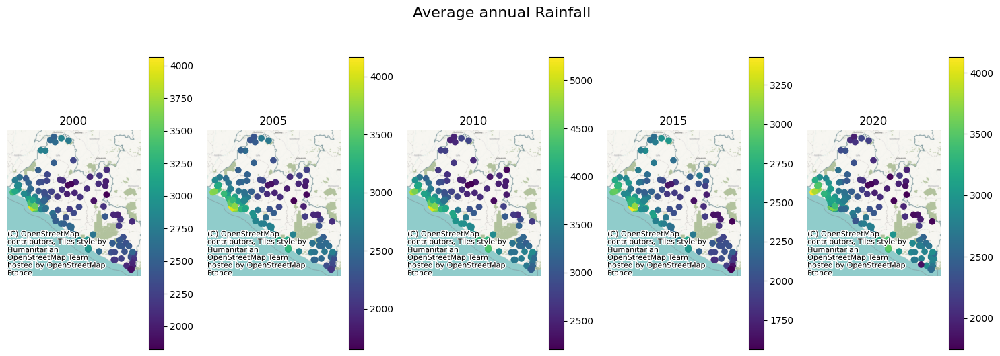

In [ ]:
fig, ax = plt.subplots(1, len(columns[97:102]) ,figsize=(15, 5))

for i, column in enumerate(columns[97:102]):
    gdf_combined.plot(column=column, cmap='viridis', ax=ax[i], legend=True)
    ctx.add_basemap(ax=ax[i], crs=gdf.crs)
    ax[i].set_title(column.split('_')[1])
    ax[i].axis('off')

plt.suptitle('Average annual Rainfall', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

In [ ]:
rainfall_columns = ['DHSREGNA', 'Rainfall_2000',
 'Rainfall_2005',
 'Rainfall_2010',
 'Rainfall_2015',
 'Rainfall_2020']
rainfall_data = gdf_combined[rainfall_columns]

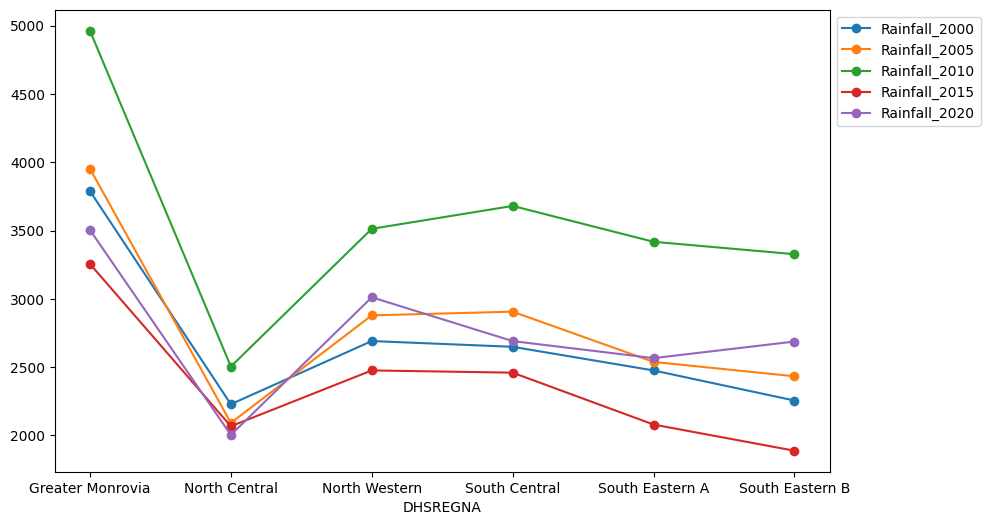

In [ ]:
ax = rainfall_data.groupby('DHSREGNA').mean().plot.line(figsize=(10,6),marker='o')
ax.legend(loc=2, bbox_to_anchor=(1.0,1.0))

In [ ]:
gdf_combined.groupby('URBAN_RURA')[rainfall_columns].mean()

<ipython-input-137-7e80a4643001>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  gdf_combined.groupby('URBAN_RURA')[rainfall_columns].mean()


,Rainfall_2000,Rainfall_2005,Rainfall_2010,Rainfall_2015,Rainfall_2020
URBAN_RURA,,,,,
R,2480.684276,2601.326636,3298.920383,2215.384747,2636.510426
U,2867.345968,2979.906002,3816.070591,2516.077218,2870.366811


In [ ]:
gdf_combined.groupby('DHSREGNA')[rainfall_columns].mean().sort_values(by='Rainfall_2020',ascending=False)


<ipython-input-136-546275f260c1>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  gdf_combined.groupby('DHSREGNA')[rainfall_columns].mean().sort_values(by='Rainfall_2020',ascending=False)


,Rainfall_2000,Rainfall_2005,Rainfall_2010,Rainfall_2015,Rainfall_2020
DHSREGNA,,,,,
Greater Monrovia,3789.038063,3952.732573,4962.925200,3255.775344,3504.472090
North Western,2691.255498,2879.347539,3512.794678,2476.163970,3011.491230
South Central,2649.059092,2906.263564,3680.368955,2459.782310,2690.863936
South Eastern B,2255.645248,2433.221161,3327.040700,1888.370977,2687.624390
South Eastern A,2476.011675,2538.382969,3417.790742,2079.945879,2566.285351
North Central,2228.751523,2091.819092,2504.558145,2067.452373,2003.769180


The average annual land surface temperature at the DHS survey cluster location. This is a global mean land surface temperature grid derived from the MODIS daytime and nighttime measurements in degrees Celsius at a spatial resolution of 0.05° × 0.05°

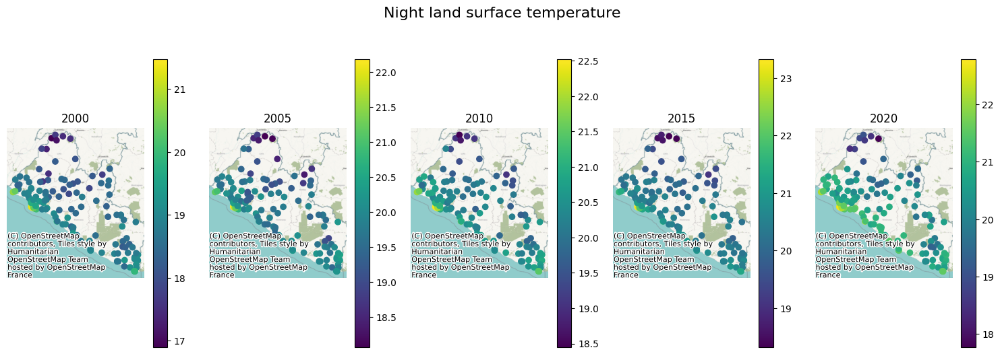

In [ ]:
fig, ax = plt.subplots(1, len(columns[82:87]) ,figsize=(15, 5))

for i, column in enumerate(columns[82:87]):
    gdf_combined.plot(column=column, cmap='viridis', ax=ax[i], legend=True)
    ctx.add_basemap(ax=ax[i], crs=gdf.crs)
    ax[i].set_title(column.split('_')[4])
    ax[i].axis('off')

plt.suptitle('Night land surface temperature', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

In [ ]:
night_land_temp_columns = ['DHSREGNA', 'Night_Land_Surface_Temp_2000',
 'Night_Land_Surface_Temp_2005',
 'Night_Land_Surface_Temp_2010',
 'Night_Land_Surface_Temp_2015',
 'Night_Land_Surface_Temp_2020']
night_land_temp_data = gdf_combined[night_land_temp_columns]

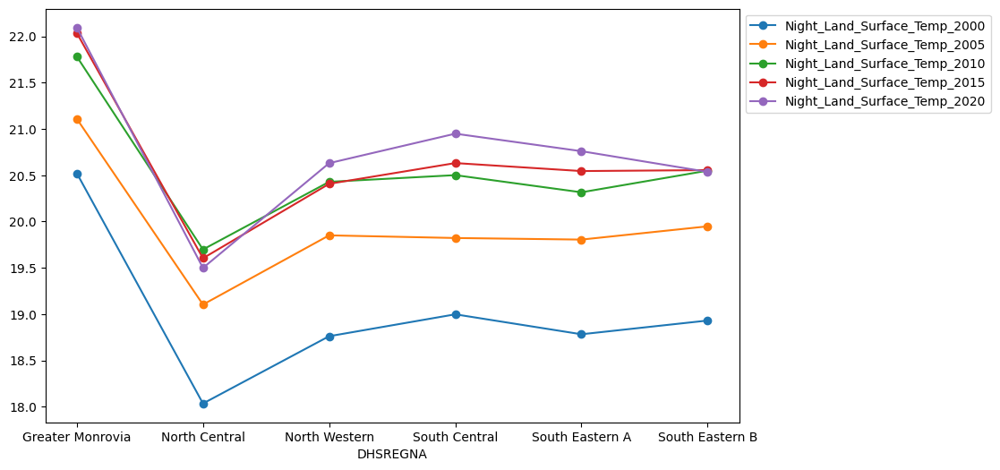

In [ ]:
ax = night_land_temp_data.groupby('DHSREGNA').mean().plot.line(figsize=(10,6),marker='o')
ax.legend(loc=2, bbox_to_anchor=(1.0,1.0))

In [ ]:
gdf_combined.groupby('URBAN_RURA')[night_land_temp_columns].mean()

<ipython-input-139-568355422f5f>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  gdf_combined.groupby('URBAN_RURA')[night_land_temp_columns].mean()


,Night_Land_Surface_Temp_2000,Night_Land_Surface_Temp_2005,Night_Land_Surface_Temp_2010,Night_Land_Surface_Temp_2015,Night_Land_Surface_Temp_2020
URBAN_RURA,,,,,
R,18.634256,19.677852,20.270254,20.296894,20.414445
U,19.440675,20.247928,20.869759,21.020894,21.133498


In [ ]:
gdf_combined.groupby('DHSREGNA')[night_land_temp_columns].mean()

<ipython-input-140-5865656c5aec>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  gdf_combined.groupby('DHSREGNA')[night_land_temp_columns].mean()


,Night_Land_Surface_Temp_2000,Night_Land_Surface_Temp_2005,Night_Land_Surface_Temp_2010,Night_Land_Surface_Temp_2015,Night_Land_Surface_Temp_2020
DHSREGNA,,,,,
Greater Monrovia,20.521478,21.109518,21.781472,22.035524,22.095594
North Central,18.035299,19.103698,19.698482,19.603771,19.499317
North Western,18.761936,19.851050,20.429073,20.407515,20.630764
South Central,18.998302,19.822501,20.501372,20.631728,20.949085
South Eastern A,18.783088,19.805390,20.316067,20.545417,20.760007
South Eastern B,18.931148,19.948366,20.549693,20.555647,20.536489


The average temperature at the DHS survey cluster location for a given year.

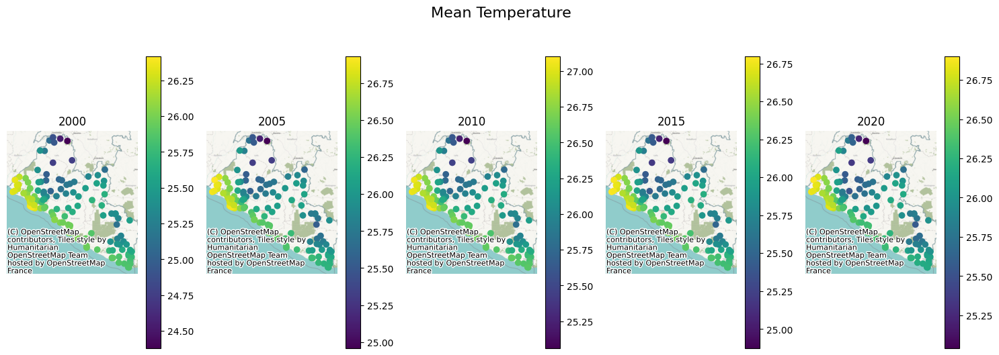

In [ ]:
fig, ax = plt.subplots(1, len(columns[71:76]) ,figsize=(15, 5))

for i, column in enumerate(columns[71:76]):
    gdf_combined.plot(column=column, cmap='viridis', ax=ax[i], legend=True)
    ctx.add_basemap(ax=ax[i], crs=gdf.crs)
    ax[i].set_title(column.split('_')[2])
    ax[i].axis('off')

plt.suptitle('Mean Temperature', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

The average maximum temperature at the DHS survey cluster location. The maximum temperature is calculated from the modeled mean temperature and the modeled diurnal
temperature range using a formula found in Harris et al. (2014). This dataset was produced by taking the average of the twelve monthly datasets for a given year.

In [ ]:
temperature_columns = ['DHSREGNA', 'Mean_Temperature_2000','Mean_Temperature_2005','Mean_Temperature_2010','Mean_Temperature_2015','Mean_Temperature_2020']
temp_data = gdf_combined[temperature_columns]
temp_data.head()

,DHSREGNA,Mean_Temperature_2000,Mean_Temperature_2005,Mean_Temperature_2010,Mean_Temperature_2015,Mean_Temperature_2020
0,Greater Monrovia,26.301954,26.824364,26.998322,26.689743,26.755398
1,Greater Monrovia,26.339888,26.858971,27.032928,26.725016,26.784014
2,Greater Monrovia,26.339888,26.858971,27.032928,26.725016,26.784014
3,Greater Monrovia,26.339888,26.858971,27.032928,26.725016,26.784014
4,Greater Monrovia,26.377823,26.893578,27.067535,26.760286,26.812630


<Axes: xlabel='DHSREGNA'>

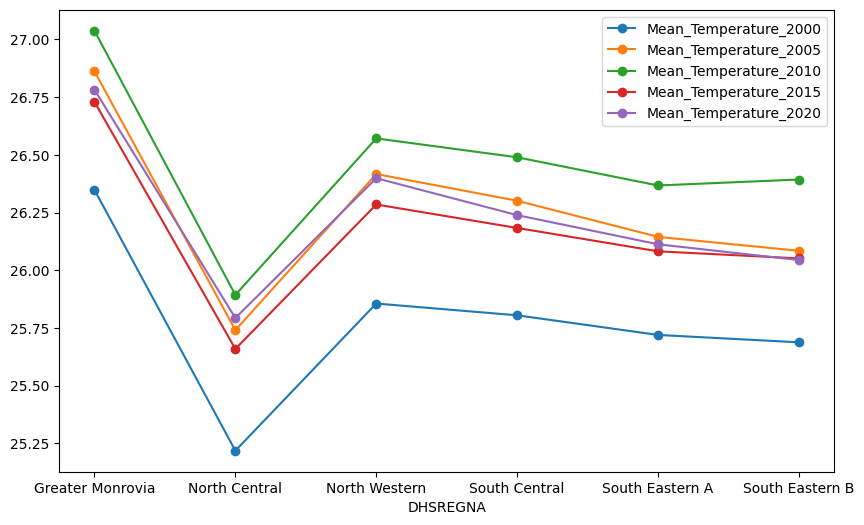

In [ ]:
temp_data.groupby('DHSREGNA').mean().plot.line(figsize=(10,6),marker='o')

In [ ]:
gdf_combined.groupby('URBAN_RURA')[temperature_columns].mean()

<ipython-input-141-76368421009c>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  gdf_combined.groupby('URBAN_RURA')[temperature_columns].mean()


,Mean_Temperature_2000,Mean_Temperature_2005,Mean_Temperature_2010,Mean_Temperature_2015,Mean_Temperature_2020
URBAN_RURA,,,,,
R,25.642430,26.124947,26.329421,26.037877,26.103326
U,25.924956,26.414350,26.609753,26.314022,26.374562


In [ ]:
gdf_combined.groupby('DHSREGNA')[temperature_columns].mean().sort_values(by='Mean_Temperature_2020',ascending=False)

<ipython-input-143-c2eabdea8f28>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  gdf_combined.groupby('DHSREGNA')[temperature_columns].mean().sort_values(by='Mean_Temperature_2020',ascending=False)


,Mean_Temperature_2000,Mean_Temperature_2005,Mean_Temperature_2010,Mean_Temperature_2015,Mean_Temperature_2020
DHSREGNA,,,,,
Greater Monrovia,26.348108,26.861791,27.037269,26.729544,26.781985
North Western,25.855721,26.416498,26.570942,26.284705,26.398572
South Central,25.804759,26.300976,26.489075,26.183047,26.238611
South Eastern A,25.719716,26.144405,26.367031,26.081843,26.112268
South Eastern B,25.687761,26.084178,26.392905,26.051192,26.044002
North Central,25.218288,25.740586,25.893020,25.659089,25.793132


The average annual land surface temperature at the DHS survey cluster location.
Land surface temperature (LST) estimates the temperature of the land surface (skin temperature), which is detected by satellites via looking through the atmosphere to the ground. The LST is not
equivalent to near-surface air temperature measured by ground stations, and their relationship is complex from a theoretical and empirical perspective.

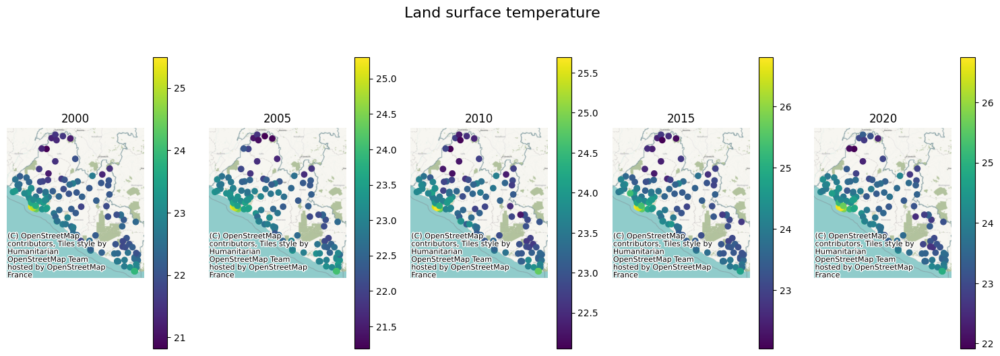

In [ ]:
fig, ax = plt.subplots(1, len(columns[46:51]) ,figsize=(15, 5))

for i, column in enumerate(columns[46:51]):
    gdf_combined.plot(column=column, cmap='viridis', ax=ax[i], legend=True)
    ctx.add_basemap(ax=ax[i], crs=gdf.crs)
    ax[i].set_title(column.split('_')[3])
    ax[i].axis('off')

plt.suptitle('Land surface temperature', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

In [ ]:
surface_temp_columns = ['DHSREGNA', 'Land_Surface_Temperature_2000',
 'Land_Surface_Temperature_2005',
 'Land_Surface_Temperature_2010',
 'Land_Surface_Temperature_2015',
 'Land_Surface_Temperature_2020']
surface_temp_data = gdf_combined[surface_temp_columns]

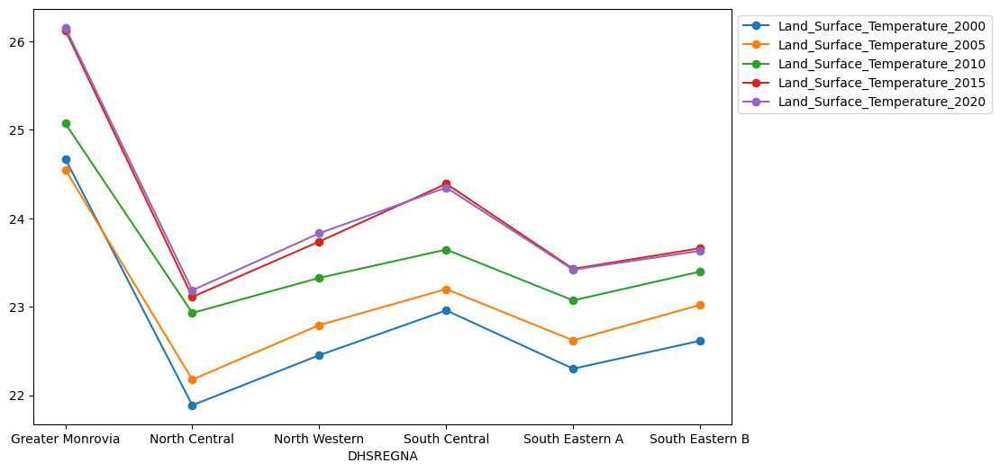

In [ ]:
ax = surface_temp_data.groupby('DHSREGNA').mean().plot.line(figsize=(10,6),marker='o')
ax.legend(loc=2, bbox_to_anchor=(1.0,1.0))

In [ ]:
gdf_combined.groupby('URBAN_RURA')[surface_temp_columns].mean()

<ipython-input-147-0fead964ee86>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  gdf_combined.groupby('URBAN_RURA')[surface_temp_columns].mean()


,Land_Surface_Temperature_2000,Land_Surface_Temperature_2005,Land_Surface_Temperature_2010,Land_Surface_Temperature_2015,Land_Surface_Temperature_2020
URBAN_RURA,,,,,
R,22.347658,22.710558,23.203811,23.594498,23.607340
U,23.360480,23.469418,24.007398,24.639474,24.666851


In [ ]:
gdf_combined.groupby('DHSREGNA')[surface_temp_columns].mean().sort_values(by='Land_Surface_Temperature_2020',ascending=False)

<ipython-input-146-be6acdacab87>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  gdf_combined.groupby('DHSREGNA')[surface_temp_columns].mean().sort_values(by='Land_Surface_Temperature_2020',ascending=False)


,Land_Surface_Temperature_2000,Land_Surface_Temperature_2005,Land_Surface_Temperature_2010,Land_Surface_Temperature_2015,Land_Surface_Temperature_2020
DHSREGNA,,,,,
Greater Monrovia,24.669357,24.548985,25.070832,26.124161,26.154764
South Central,22.959055,23.199595,23.645831,24.389626,24.347454
North Western,22.452078,22.792571,23.326091,23.736531,23.830101
South Eastern B,22.615054,23.020645,23.396797,23.661354,23.630912
South Eastern A,22.299088,22.620115,23.071623,23.428092,23.418918
North Central,21.886705,22.175889,22.929591,23.111359,23.186142


The average diurnal temperature range at the DHS survey cluster location. Diurnal temperature range is the difference between the station’s maximum and minimum temperatures within one day. This dataset was produced by taking the average of the twelve monthly datasets.

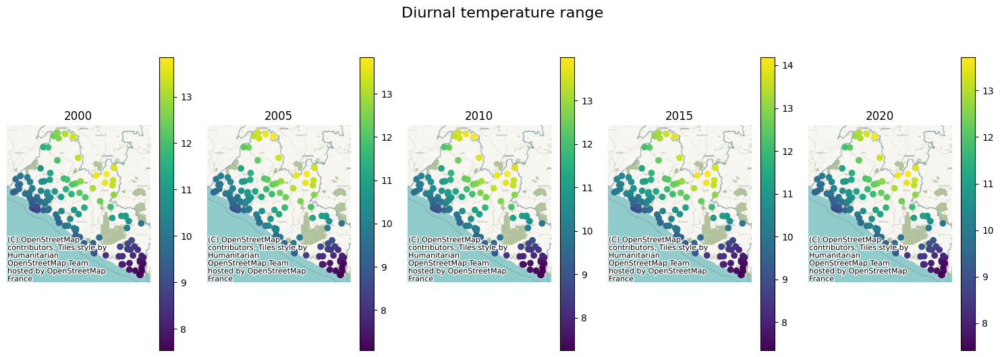

In [ ]:
fig, ax = plt.subplots(1, len(columns[21:26]) ,figsize=(15, 5))

for i, column in enumerate(columns[21:26]):
    gdf_combined.plot(column=column, cmap='viridis', ax=ax[i], legend=True)
    ctx.add_basemap(ax=ax[i], crs=gdf.crs)
    ax[i].set_title(column.split('_')[3])
    ax[i].axis('off')

plt.suptitle('Diurnal temperature range', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

In [ ]:
diurnal_temp_columns = ['DHSREGNA', 'Diurnal_Temperature_Range_2000',
 'Diurnal_Temperature_Range_2005',
 'Diurnal_Temperature_Range_2010',
 'Diurnal_Temperature_Range_2015',
 'Diurnal_Temperature_Range_2020']
diurnal_temp_data = gdf_combined[diurnal_temp_columns]

<Axes: xlabel='DHSREGNA'>

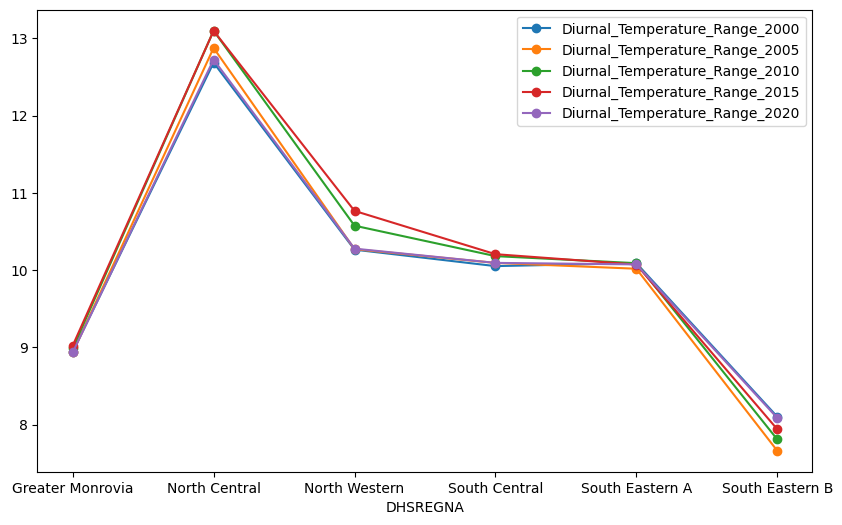

In [ ]:
diurnal_temp_data.groupby('DHSREGNA').mean().plot.line(figsize=(10,6),marker='o')

In [ ]:
gdf_combined.groupby('URBAN_RURA')[diurnal_temp_columns].mean()

<ipython-input-149-c8a198362694>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  gdf_combined.groupby('URBAN_RURA')[diurnal_temp_columns].mean()


,Diurnal_Temperature_Range_2000,Diurnal_Temperature_Range_2005,Diurnal_Temperature_Range_2010,Diurnal_Temperature_Range_2015,Diurnal_Temperature_Range_2020
URBAN_RURA,,,,,
R,10.180256,10.134514,10.303751,10.367449,10.206825
U,9.840883,9.791526,9.913818,9.971510,9.828553


In [ ]:
gdf_combined.groupby('DHSREGNA')[diurnal_temp_columns].mean()

<ipython-input-148-7e1ca8d123a8>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  gdf_combined.groupby('DHSREGNA')[diurnal_temp_columns].mean()


,Diurnal_Temperature_Range_2000,Diurnal_Temperature_Range_2005,Diurnal_Temperature_Range_2010,Diurnal_Temperature_Range_2015,Diurnal_Temperature_Range_2020
DHSREGNA,,,,,
Greater Monrovia,8.945076,8.934899,8.986787,9.022940,8.934899
North Central,12.686736,12.877199,13.100336,13.099452,12.725758
North Western,10.265919,10.272085,10.576448,10.767746,10.279141
South Central,10.052890,10.094503,10.182234,10.207299,10.094663
South Eastern A,10.091146,10.018926,10.090770,10.073251,10.074990
South Eastern B,8.103101,7.662827,7.809717,7.941216,8.087469


The mean annual daytime land surface at the DHS survey cluster location.
Land surface temperature (LST) estimates the temperature of the land surface (skin temperature), which is detected by satellites by looking through the atmosphere to the ground.

In [ ]:
fig, ax = plt.subplots(1, len(columns[16:21]) ,figsize=(15, 5))

for i, column in enumerate(columns[16:21]):
    gdf_combined.plot(column=column, cmap='viridis', ax=ax[i], legend=True)
    ctx.add_basemap(ax=ax[i], crs=gdf.crs)
    ax[i].set_title(column.split('_')[4])
    ax[i].axis('off')

plt.suptitle('Day land surface temperature', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

ValueError: Number of columns must be a positive integer, not 0

<Figure size 1500x500 with 0 Axes>

In [ ]:
day_land_temp_columns = ['DHSREGNA', 'Day_Land_Surface_Temp_2000',
 'Day_Land_Surface_Temp_2005',
 'Day_Land_Surface_Temp_2010',
 'Day_Land_Surface_Temp_2015',
 'Day_Land_Surface_Temp_2020']
day_land_temp_data = gdf_combined[day_land_temp_columns]
day_land_temp_data.head()

,DHSREGNA,Day_Land_Surface_Temp_2000,Day_Land_Surface_Temp_2005,Day_Land_Surface_Temp_2010,Day_Land_Surface_Temp_2015,Day_Land_Surface_Temp_2020
0,Greater Monrovia,27.493382,26.824942,27.138380,29.065477,29.136055
1,Greater Monrovia,28.561752,27.581249,28.019398,30.009760,30.047247
2,Greater Monrovia,28.561752,27.581249,28.019398,30.009760,30.047247
3,Greater Monrovia,28.561752,27.581249,28.019398,30.009760,30.047247
4,Greater Monrovia,29.197298,28.137222,28.455383,30.316696,30.301136


<Axes: xlabel='DHSREGNA'>

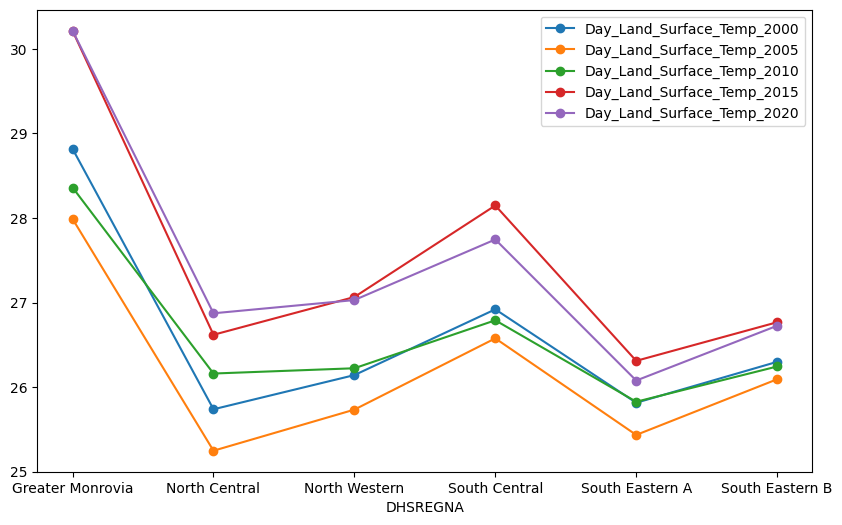

In [ ]:
day_land_temp_data.groupby('DHSREGNA').mean().plot.line(figsize=(10,6),marker='o')

In [ ]:
gdf_combined.groupby('URBAN_RURA')[day_land_temp_columns].mean()

<ipython-input-152-b4a96c626c40>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  gdf_combined.groupby('URBAN_RURA')[day_land_temp_columns].mean()


,Day_Land_Surface_Temp_2000,Day_Land_Surface_Temp_2005,Day_Land_Surface_Temp_2010,Day_Land_Surface_Temp_2015,Day_Land_Surface_Temp_2020
URBAN_RURA,,,,,
R,26.061060,25.743263,26.137368,26.892103,26.800236
U,27.280285,26.690908,27.145036,28.258055,28.200204


In [ ]:
gdf_combined.groupby('DHSREGNA')[day_land_temp_columns].mean()

<ipython-input-153-2f2acb7862bc>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  gdf_combined.groupby('DHSREGNA')[day_land_temp_columns].mean()


,Day_Land_Surface_Temp_2000,Day_Land_Surface_Temp_2005,Day_Land_Surface_Temp_2010,Day_Land_Surface_Temp_2015,Day_Land_Surface_Temp_2020
DHSREGNA,,,,,
Greater Monrovia,28.817236,27.988453,28.360193,30.212798,30.213933
North Central,25.738110,25.248080,26.160700,26.618946,26.872967
North Western,26.142219,25.734091,26.223110,27.065548,27.029439
South Central,26.919808,26.576690,26.790288,28.147525,27.745824
South Eastern A,25.815089,25.434840,25.827179,26.310768,26.077830
South Eastern B,26.298960,26.092925,26.243902,26.767061,26.725333


The average monthly precipitation measured at the DHS survey cluster location in a given year. (Millimeters per month)

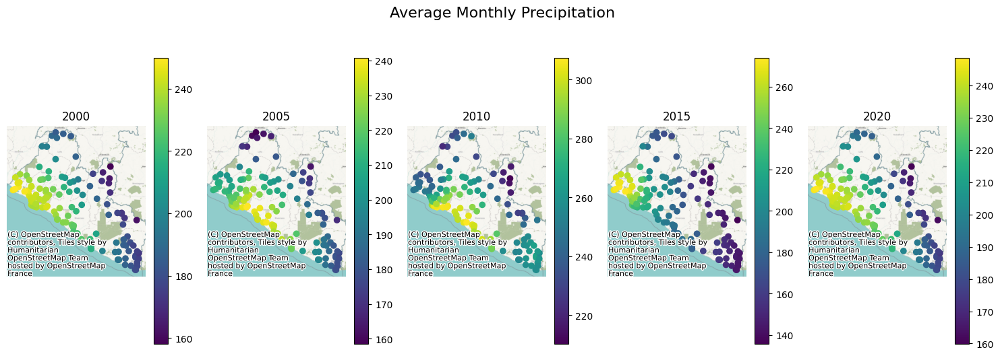

In [ ]:
fig, ax = plt.subplots(1, len(columns[92:97]) ,figsize=(15, 5))

for i, column in enumerate(columns[92:97]):
    gdf_combined.plot(column=column, cmap='viridis', ax=ax[i], legend=True)
    ctx.add_basemap(ax=ax[i], crs=gdf.crs)
    ax[i].set_title(column.split('_')[1])
    ax[i].axis('off')

plt.suptitle('Average Monthly Precipitation', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

#ENVIRONMENT EDA

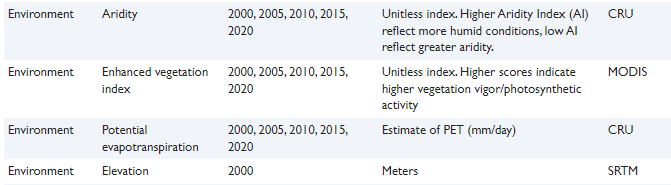

The average vegetation index value at the DHS survey cluster at the time of measurement (year).

Vegetation index value between -1 (least vegetation) and 1 (most vegetation).

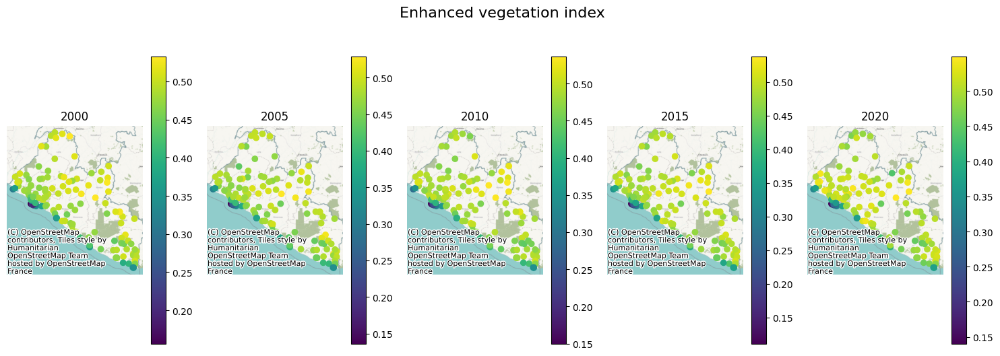

In [ ]:
fig, ax = plt.subplots(1, len(columns[28:33]) ,figsize=(15, 5))

for i, column in enumerate(columns[28:33]):
    gdf_combined.plot(column=column, cmap='viridis', ax=ax[i], legend=True)
    ctx.add_basemap(ax=ax[i], crs=gdf.crs)
    ax[i].set_title(column.split('_')[3])
    ax[i].axis('off')

plt.suptitle('Enhanced vegetation index', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

In [ ]:
evi_columns = ['DHSREGNA', 'Enhanced_Vegetation_Index_2000',
 'Enhanced_Vegetation_Index_2005',
 'Enhanced_Vegetation_Index_2010',
 'Enhanced_Vegetation_Index_2015',
 'Enhanced_Vegetation_Index_2020']
evi_data = gdf_combined[evi_columns]

<Axes: xlabel='DHSREGNA'>

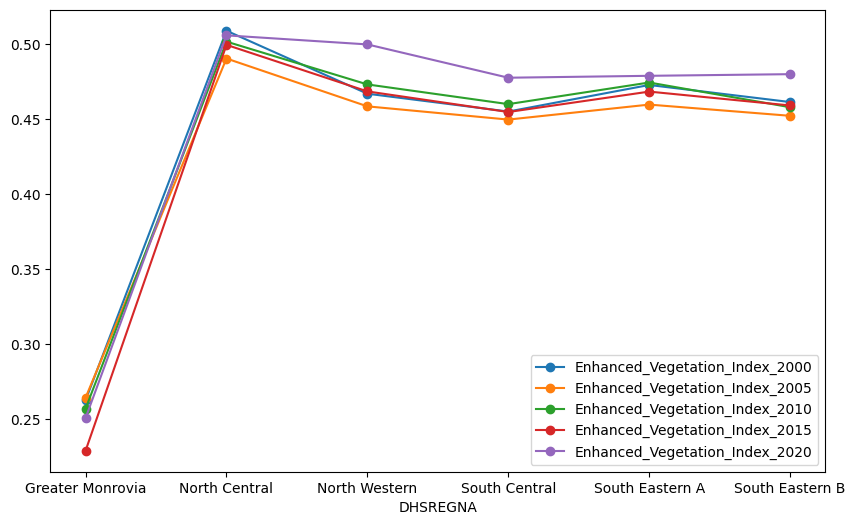

In [ ]:
evi_data.groupby('DHSREGNA').mean().plot.line(figsize=(10,6),marker='o')

In [ ]:
frost_columns = ['DHSREGNA', 'Frost_Days_2000',
 'Frost_Days_2005',
 'Frost_Days_2010',
 'Frost_Days_2015',
 'Frost_Days_2020']
frost_data = gdf_combined[frost_columns]

In [ ]:
gdf_combined[frost_columns].describe(include='all')

,DHSREGNA,Frost_Days_2000,Frost_Days_2005,Frost_Days_2010,Frost_Days_2015,Frost_Days_2020
count,150,150.0,150.0,150.0,150.0,150.0
unique,6,NaN,NaN,NaN,NaN,NaN
top,Greater Monrovia,NaN,NaN,NaN,NaN,NaN
freq,25,NaN,NaN,NaN,NaN,NaN
mean,NaN,0.0,0.0,0.0,0.0,0.0
std,NaN,0.0,0.0,0.0,0.0,0.0
min,NaN,0.0,0.0,0.0,0.0,0.0
25%,NaN,0.0,0.0,0.0,0.0,0.0
50%,NaN,0.0,0.0,0.0,0.0,0.0
75%,NaN,0.0,0.0,0.0,0.0,0.0


The average potential evapotranspiration (PET) at the DHS survey cluster location. This dataset was produced by taking the average of the twelve monthly datasets, which represent millimeters
per day, for a given year.

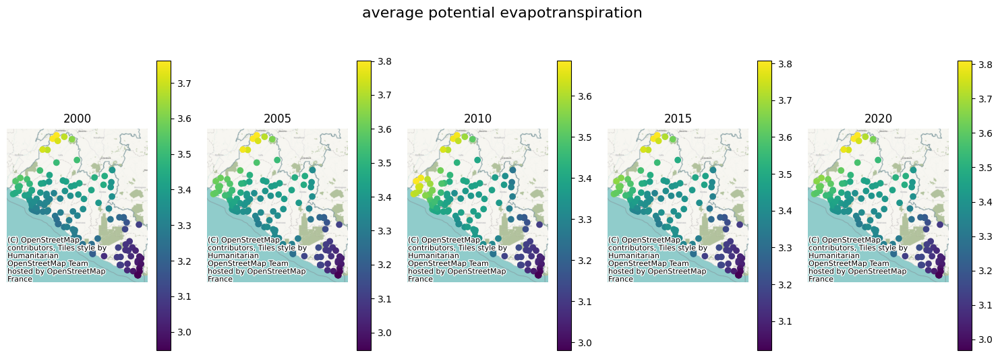

In [ ]:
fig, ax = plt.subplots(1, len(columns[87:92]) ,figsize=(15, 5))

for i, column in enumerate(columns[87:92]):
    gdf_combined.plot(column=column, cmap='viridis', ax=ax[i], legend=True)
    ctx.add_basemap(ax=ax[i], crs=gdf.crs)
    ax[i].set_title(column.split('_')[1])
    ax[i].axis('off')

plt.suptitle('average potential evapotranspiration', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

PET: The number shows the number
millimeters of water that would be evaporated into the air over the course of a year if there was
unlimited water at the location.


In [ ]:
pet_columns = ['DHSREGNA', 'PET_2000',
 'PET_2005',
 'PET_2010',
 'PET_2015',
 'PET_2020']
pet_data = gdf_combined[pet_columns]

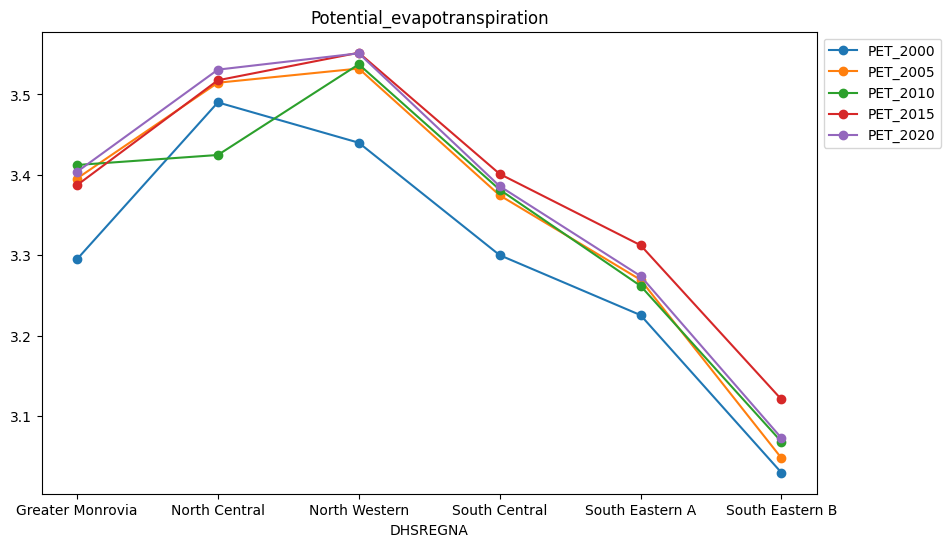

In [ ]:
ax = pet_data.groupby('DHSREGNA').mean().plot.line(figsize=(10,6),marker='o')
ax.set_title("Potential_evapotranspiration")
ax.legend(loc=2, bbox_to_anchor=(1.0,1.0))

The dataset represents the average monthly precipitation divided by average monthly potential
evapotranspiration, an aridity index defined by the United Nations Environmental Programme
(UNEP).
Aridity Index (AI), which is defined as the ratio of annual precipitation to annual potential
evapotranspiration, is a key parameter in drought characterization.

Index between 0 (most arid) and 300 (most wet)

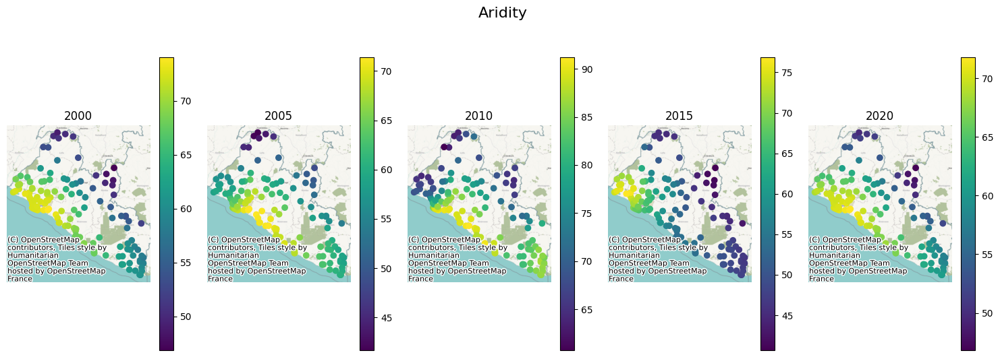

In [ ]:
fig, ax = plt.subplots(1, len(columns[11:16]) ,figsize=(15, 5))

for i, column in enumerate(columns[11:16]):
    gdf_combined.plot(column=column, cmap='viridis', ax=ax[i], legend=True)
    ctx.add_basemap(ax=ax[i], crs=gdf.crs)
    ax[i].set_title(column.split('_')[1])
    ax[i].axis('off')

plt.suptitle('Aridity', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

In [ ]:
aridity_columns = ['DHSREGNA', 'Aridity_2000',
 'Aridity_2005',
 'Aridity_2010',
 'Aridity_2015',
 'Aridity_2020']
aridity_data = gdf_combined[aridity_columns]
aridity_data.head()

,DHSREGNA,Aridity_2000,Aridity_2005,Aridity_2010,Aridity_2015,Aridity_2020
0,Greater Monrovia,72.334373,65.501083,83.642387,70.728218,70.137138
1,Greater Monrovia,72.342628,66.210594,85.366310,70.012207,70.203583
2,Greater Monrovia,72.342628,66.210594,85.366310,70.012207,70.203583
3,Greater Monrovia,72.342628,66.210594,85.366310,70.012207,70.203583
4,Greater Monrovia,72.350937,66.924545,87.100960,69.290573,70.270447


<Axes: xlabel='DHSREGNA'>

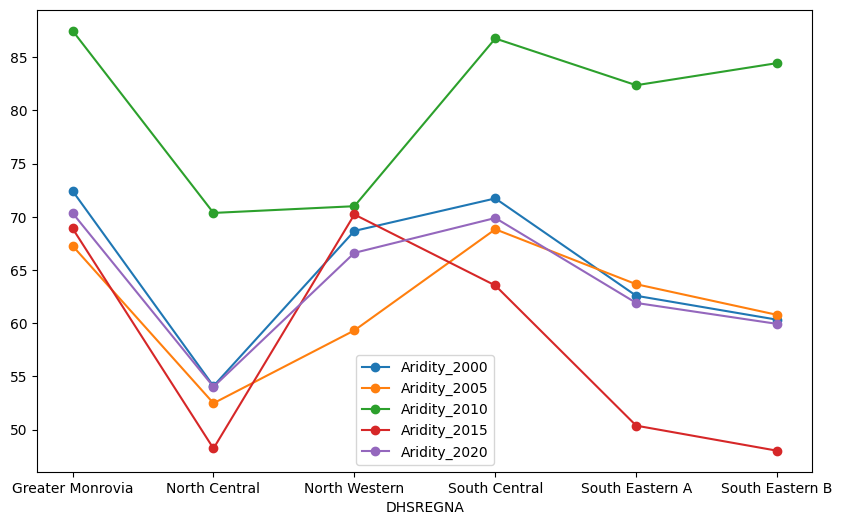

In [ ]:
aridity_data.groupby('DHSREGNA').mean().plot.line(figsize = (10,6),marker='o')

Mean Elevation (meters) Year 2000

A Digital Elevation Model (DEM) represents the topographic surface of the bare Earth, therefore excluding trees, buildings, and any additional surface objects.

<Figure size 1000x800 with 0 Axes>

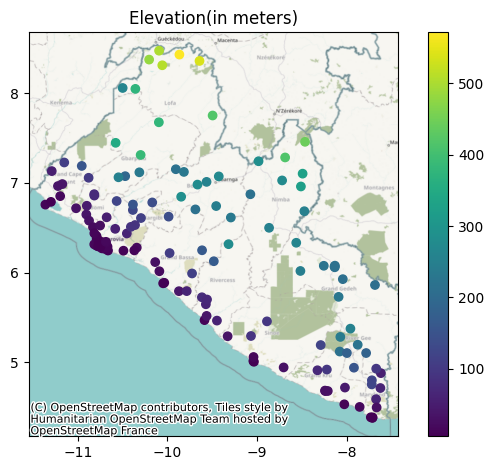

In [ ]:
plt.figure(figsize=(10, 8))
ax = gdf_combined.plot(column='Elevation', cmap='viridis',legend=True)
ctx.add_basemap(ax=ax, crs=gdf.crs)
ax.set_title('Elevation(in meters)')

#plt.suptitle('Drought Episodes', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

#AGRICULTURE EDA

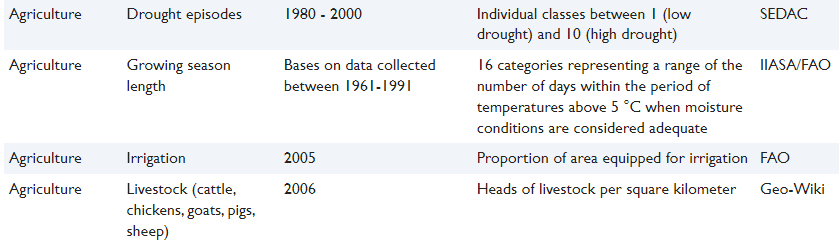

The average number of drought episodes (categorized between 1 (low) and 10 (high)) at the DHS survey cluster location.

<Figure size 1000x800 with 0 Axes>

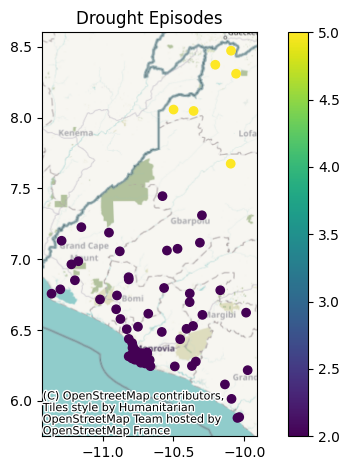

In [ ]:
plt.figure(figsize=(10, 8))
ax = gdf_combined.plot(column='Drought_Episodes', cmap='viridis',legend=True)
ctx.add_basemap(ax=ax, crs=gdf.crs)
ax.set_title('Drought Episodes')

#plt.suptitle('Drought Episodes', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

The average proportion of the area at the DHS survey cluster location that is equipped for irrigation at the time of measurement.

<Figure size 1000x800 with 0 Axes>

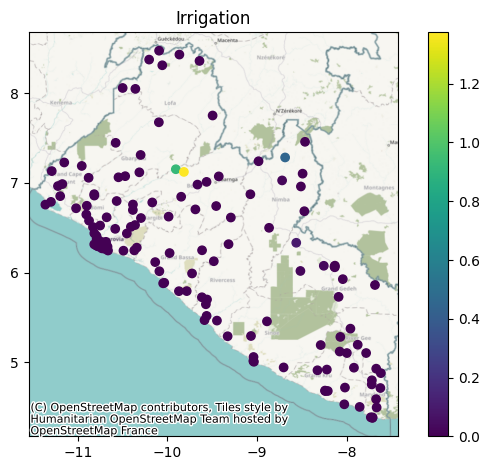

In [ ]:
plt.figure(figsize=(10, 8))
ax = gdf_combined.plot(column='Irrigation', cmap='viridis',legend=True)
ctx.add_basemap(ax=ax, crs=gdf.crs)
ax.set_title('Irrigation')

#plt.suptitle('Drought Episodes', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

The length of the growing season in days (reported in one of 16 categories) for DHS survey cluster locations.

The length of available growing period refers to the number of days within the period of temperatures above 5°C when moisture conditions are considered adequate for crop growth.
Under rain-fed conditions, the beginning of the growing period is linked to the start of the rainy season. The growing period for most crops continues beyond the rainy season and, to a greater
or lesser extent, crops mature on moisture stored in the soil profile.

<Figure size 1000x800 with 0 Axes>

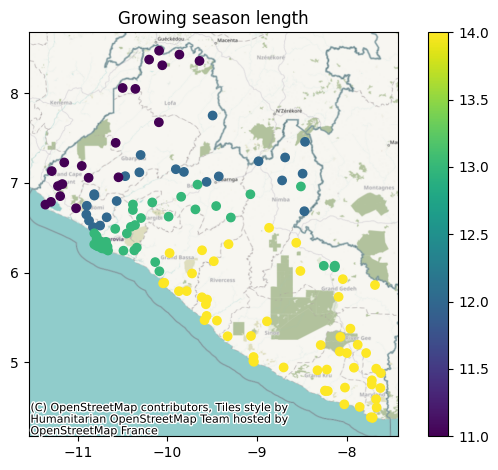

In [ ]:
plt.figure(figsize=(10, 8))
ax = gdf_combined.plot(column='Growing_Season_Length', cmap='viridis',legend=True)
ctx.add_basemap(ax=ax, crs=gdf.crs)
ax.set_title('Growing season length')
plt.tight_layout()
plt.show()

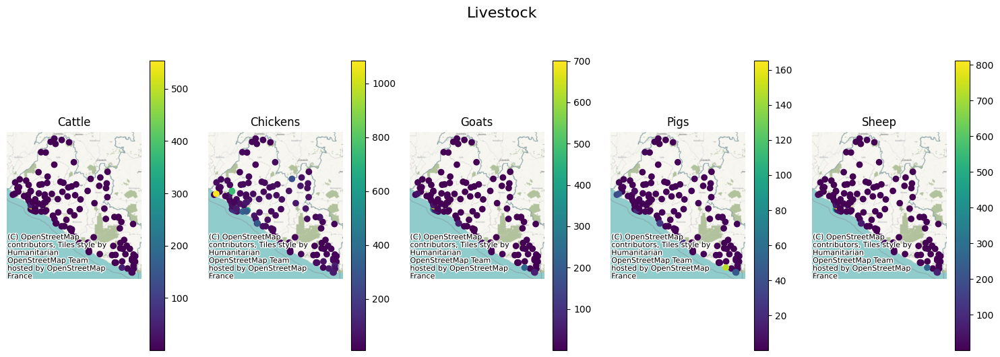

In [ ]:
fig, ax = plt.subplots(1, len(columns[51:56]) ,figsize=(15, 5))

for i, column in enumerate(columns[51:56]):
    gdf_combined.plot(column=column, cmap='viridis', ax=ax[i], legend=True)
    ctx.add_basemap(ax=ax[i], crs=gdf.crs)
    ax[i].set_title(column.split('_')[1])
    ax[i].axis('off')

plt.suptitle('Livestock', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

The average density of livestock at the DHS survey cluster location.

In [ ]:
livestock_columns = ['DHSREGNA', 'Livestock_Cattle','Livestock_Chickens','Livestock_Goats','Livestock_Pigs','Livestock_Sheep']
livestock_data = gdf_combined[livestock_columns]
livestock_data.head()

,DHSREGNA,Livestock_Cattle,Livestock_Chickens,Livestock_Goats,Livestock_Pigs,Livestock_Sheep
0,Greater Monrovia,1.538566,108.056854,103.203773,39.562714,117.866013
1,Greater Monrovia,2.756487,208.589874,173.762009,8.868350,196.709488
2,Greater Monrovia,2.756487,208.589874,173.762009,8.868350,196.709488
3,Greater Monrovia,2.756487,208.589874,173.762009,8.868350,196.709488
4,Greater Monrovia,0.379287,144.631103,41.530186,4.293781,26.466120


<Axes: xlabel='DHSREGNA'>

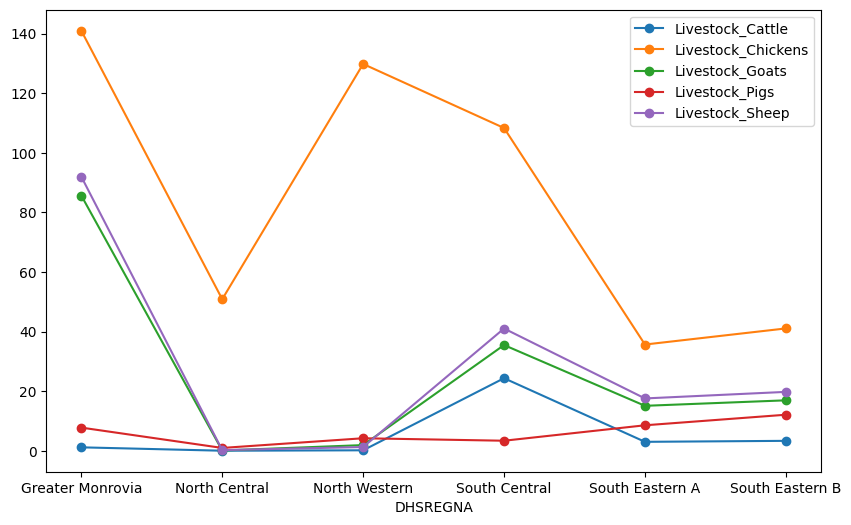

In [ ]:
livestock_data.groupby('DHSREGNA').mean().plot.line(figsize = (10,6),marker='o')

# Demography EDA

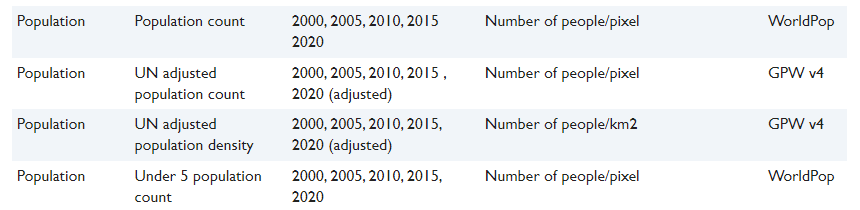

The average UN-adjusted population density of the area at the DHS survey cluster location(Number of people per square kilometer).

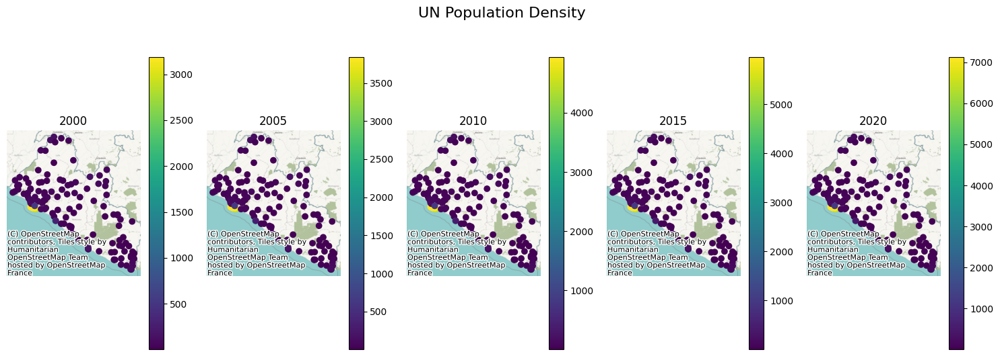

In [ ]:
fig, ax = plt.subplots(1, len(columns[125:130]) ,figsize=(15, 5))

for i, column in enumerate(columns[125:130]):
    gdf_combined.plot(column=column, cmap='viridis', ax=ax[i], legend=True)
    ctx.add_basemap(ax=ax[i], crs=gdf.crs)
    ax[i].set_title(column.split('_')[3])
    ax[i].axis('off')

plt.suptitle('UN Population Density', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

In [ ]:
pop_density_columns = ['DHSREGNA', 'UN_Population_Density_2000',
 'UN_Population_Density_2005',
 'UN_Population_Density_2010',
 'UN_Population_Density_2015',
 'UN_Population_Density_2020']
pop_density_data = gdf_combined[pop_density_columns]

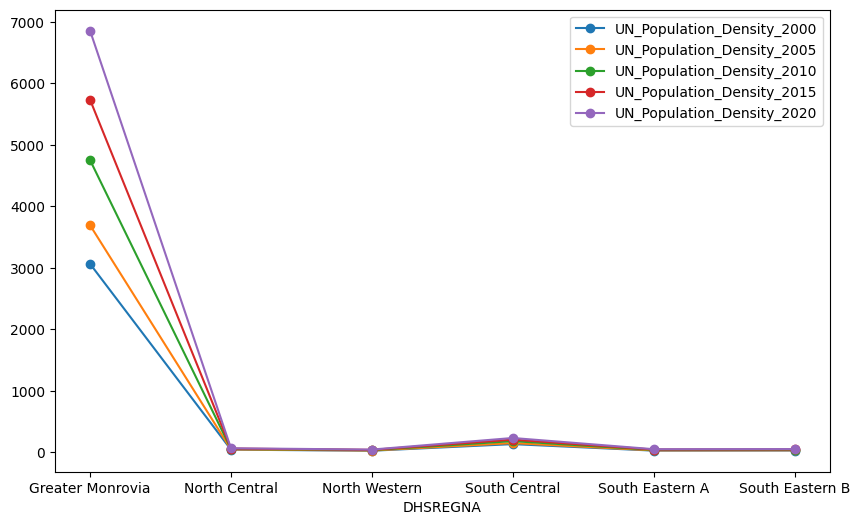

In [ ]:
ax = pop_density_data.groupby('DHSREGNA').mean().plot.line(figsize=(10,6),marker='o')
#ax.legend(loc=2, bbox_to_anchor=(1.0,1.0))

The count of individuals living in the 5 x 5 km pixel in which the DHS survey cluster is located at the time of measurement (year).

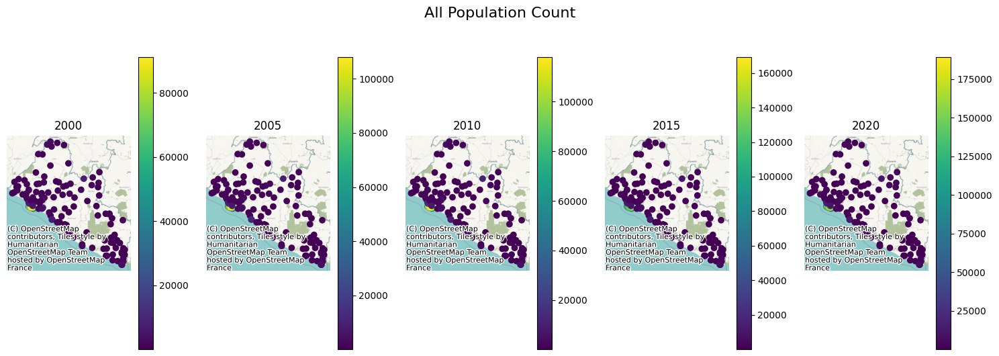

In [ ]:
fig, ax = plt.subplots(1, len(columns[6:11]) ,figsize=(15, 5))

for i, column in enumerate(columns[6:11]):
    gdf_combined.plot(column=column, cmap='viridis', ax=ax[i], legend=True)
    ctx.add_basemap(ax=ax[i], crs=gdf.crs)
    ax[i].set_title(column.split('_')[3])
    ax[i].axis('off')

plt.suptitle('All Population Count', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

The number of people under the age of 5 (U5) at the time of measurement (year) living in the 5 x 5 km pixel in which the DHS survey cluster is located. (Number of people).

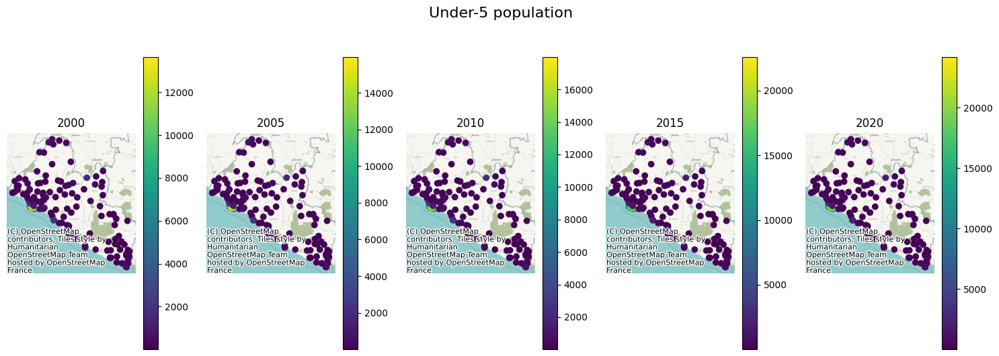

In [ ]:
fig, ax = plt.subplots(1, len(columns[115:120]) ,figsize=(15, 5))

for i, column in enumerate(columns[115:120]):
    gdf_combined.plot(column=column, cmap='viridis', ax=ax[i], legend=True)
    ctx.add_basemap(ax=ax[i], crs=gdf.crs)
    ax[i].set_title(column.split('_')[2])
    ax[i].axis('off')

plt.suptitle('Under-5 population', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()

In [ ]:
under5_pop_columns = ['DHSREGNA', 'U5_Population_2000',
 'U5_Population_2005',
 'U5_Population_2010',
 'U5_Population_2015',
 'U5_Population_2020']
under5_pop_data = gdf_combined[under5_pop_columns]

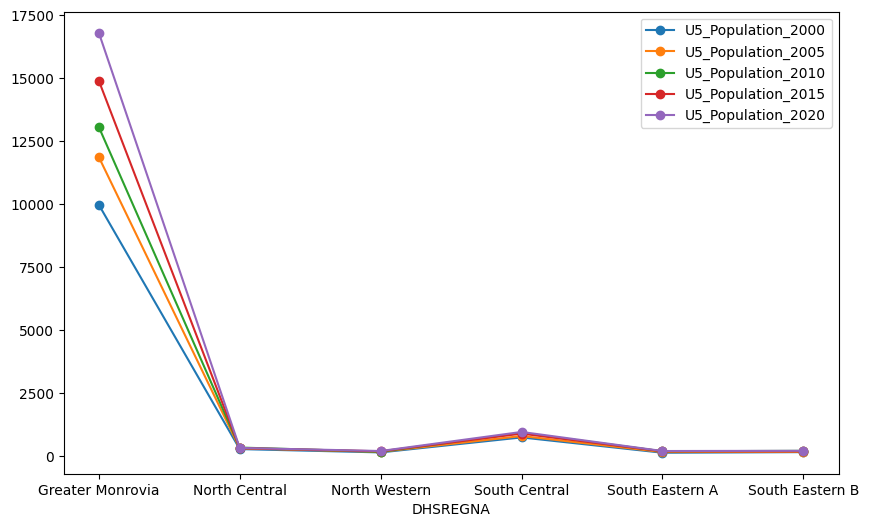

In [ ]:
ax = under5_pop_data.groupby('DHSREGNA').mean().plot.line(figsize=(10,6),marker='o')
#ax.legend(loc=2, bbox_to_anchor=(1.0,1.0))

#INFRASTRUCTURE EDA

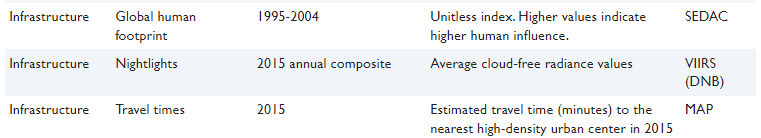

The average time (minutes) required to reach a high-density urban center, as defined by Pesaresi
and Freire (2016), from the DHS survey cluster location, based on year 2015 infrastructure data.
Travel times or accessibility estimates provide a useful measure of the extent to which regions
are rural or urban, as well as the degree of their connectedness to the national system of
transportation. For instance, locations that are near major roads would be relatively well
connected, even if they were some distance from major cities

In [ ]:
travel_time_columns = ['DHSREGNA', 'Travel_Times']
travel_time_data = gdf_combined[travel_time_columns]

<Axes: xlabel='DHSREGNA'>

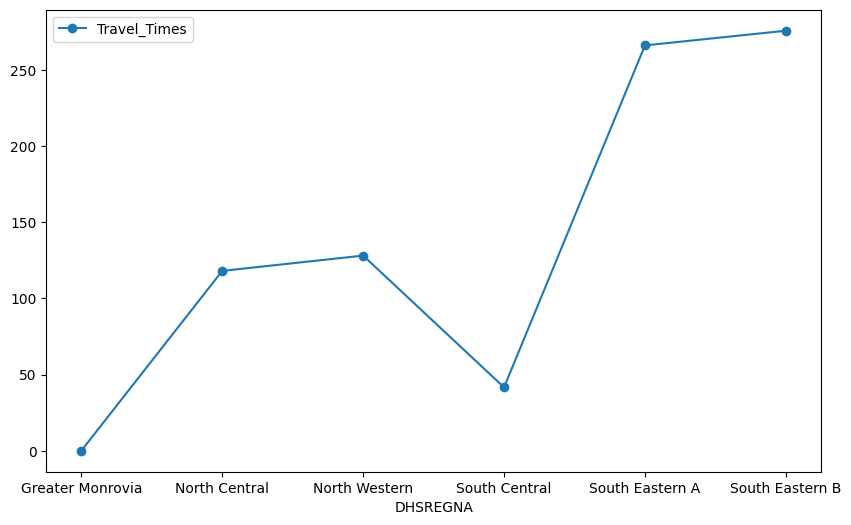

In [ ]:
travel_time_data.groupby('DHSREGNA').mean().plot.line(figsize=(10,6),marker='o')

The average nighttime luminosity of the area at the DHS survey cluster location.

Nightlights measure the luminosity of an area during the nighttime hours as measured by the Visible Infrared Imaging Radiometer Suite (VIIRS). These surfaces allow differentiation of regions based on the density of population and the degree of electrification of dwellings, commercial and industrial premises, and infrastructure.

<Figure size 1000x800 with 0 Axes>

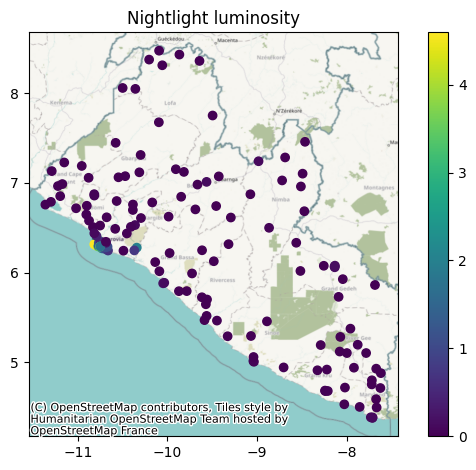

In [ ]:
plt.figure(figsize=(10, 8))
ax = gdf_combined.plot(column='Nightlights_Composite', cmap='viridis',legend=True)
ctx.add_basemap(ax=ax, crs=gdf.crs)
ax.set_title('Nightlight luminosity')
plt.tight_layout()
plt.show()

Global human footprint index between 0 (extremely rural) and 100 (extremely urban).

<Figure size 1000x800 with 0 Axes>

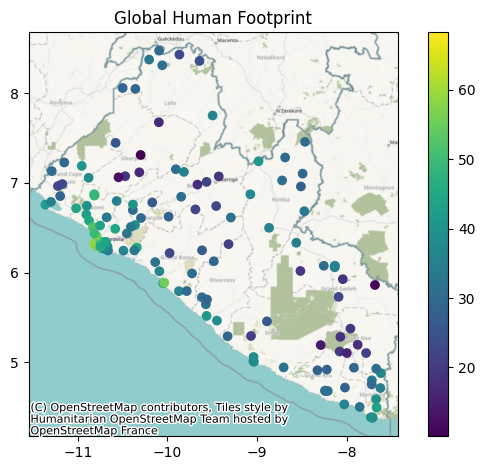

In [ ]:
plt.figure(figsize=(10, 8))
ax = gdf_combined.plot(column='Global_Human_Footprint', cmap='viridis',legend=True)
ctx.add_basemap(ax=ax, crs=gdf.crs)
ax.set_title('Global Human Footprint')
plt.tight_layout()
plt.show()

In [ ]:
# Create a dictionary to store columns grouped by year
columns_by_year = {}

# Iterate over column names
for column in columns:
    # Extract the year from the column name
    year = column.split('_')[-1]
    # Group columns by year
    columns_by_year.setdefault(year, []).append(column)

# Print the columns grouped by year
for year, columns in columns_by_year.items():
    print(f'Columns for year {year}:')
    print(columns)
    print()

Columns for year DHSID:
['DHSID']

Columns for year Dataset:
['GPS_Dataset']

Columns for year DHSCC:
['DHSCC']

Columns for year DHSYEAR:
['DHSYEAR']

Columns for year DHSCLUST:
['DHSCLUST']

Columns for year SurveyID:
['SurveyID']

Columns for year 2000:
['All_Population_Count_2000', 'Aridity_2000', 'Day_Land_Surface_Temp_2000', 'Diurnal_Temperature_Range_2000', 'Enhanced_Vegetation_Index_2000', 'Frost_Days_2000', 'ITN_Coverage_2000', 'Land_Surface_Temperature_2000', 'Malaria_Incidence_2000', 'Malaria_Prevalence_2000', 'Maximum_Temperature_2000', 'Mean_Temperature_2000', 'Minimum_Temperature_2000', 'Night_Land_Surface_Temp_2000', 'PET_2000', 'Precipitation_2000', 'Rainfall_2000', 'U5_Population_2000', 'UN_Population_Count_2000', 'UN_Population_Density_2000', 'Wet_Days_2000']

Columns for year 2005:
['All_Population_Count_2005', 'Aridity_2005', 'Day_Land_Surface_Temp_2005', 'Diurnal_Temperature_Range_2005', 'Enhanced_Vegetation_Index_2005', 'Frost_Days_2005', 'ITN_Coverage_2005', 'Lan

In [ ]:
columns_2020 = columns_by_year['2020']

In [ ]:
gdf_2020 = gpd.GeoDataFrame(gdf_combined[columns_2020], geometry=gdf_combined.geometry)

<ipython-input-95-08783051c950>:2: FutureWarning: The default value of numeric_only in GeoDataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = gdf_2020.corr('spearman')


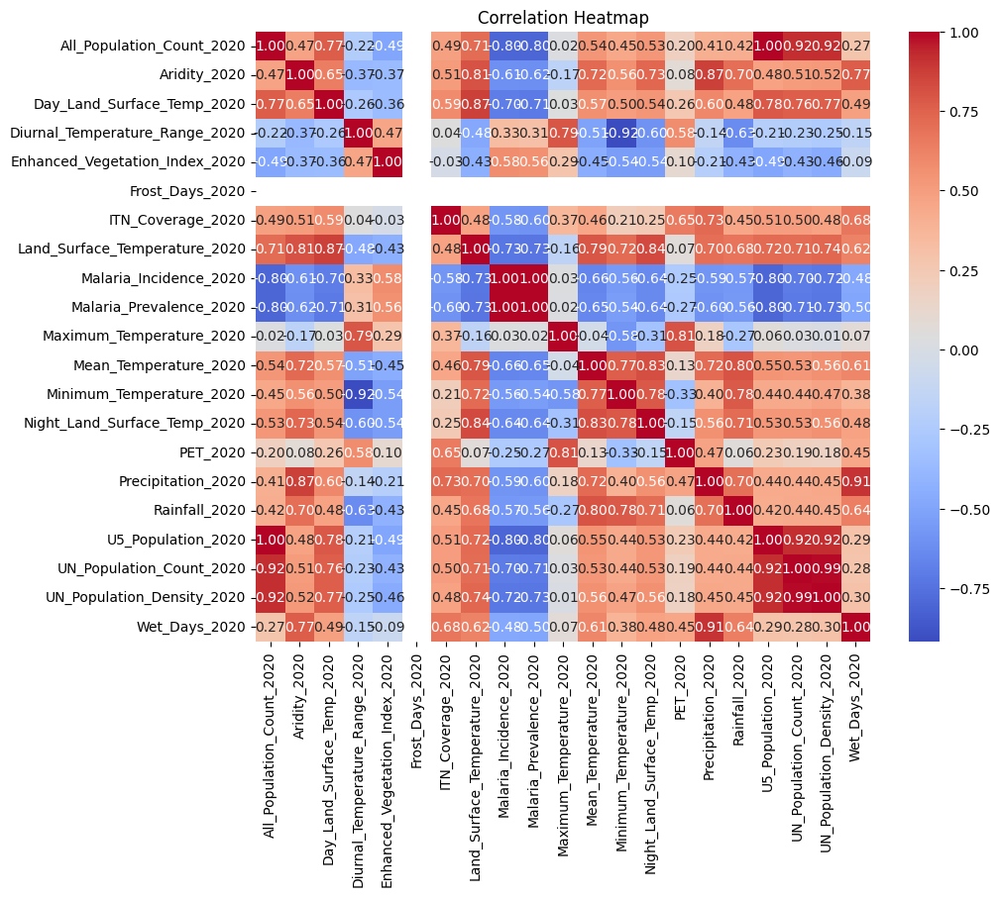

In [ ]:
# Compute correlation matrix
correlation_matrix = gdf_2020.corr('spearman')

# Plot heatmap of correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

<Figure size 1000x600 with 0 Axes>

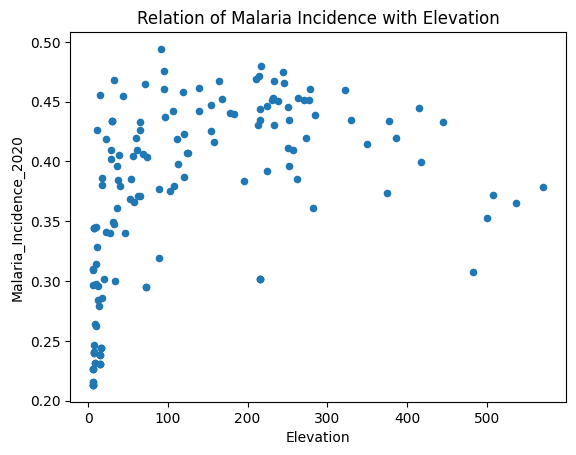

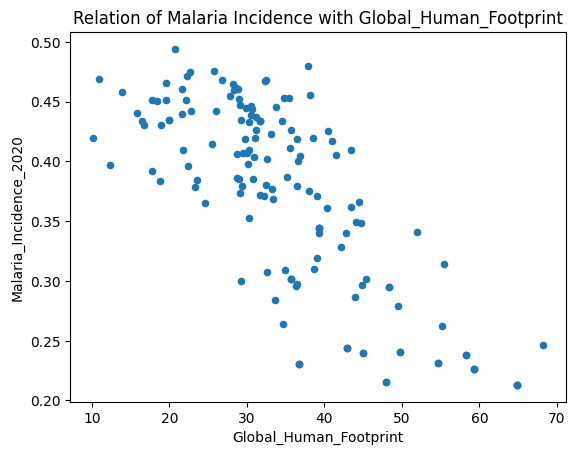

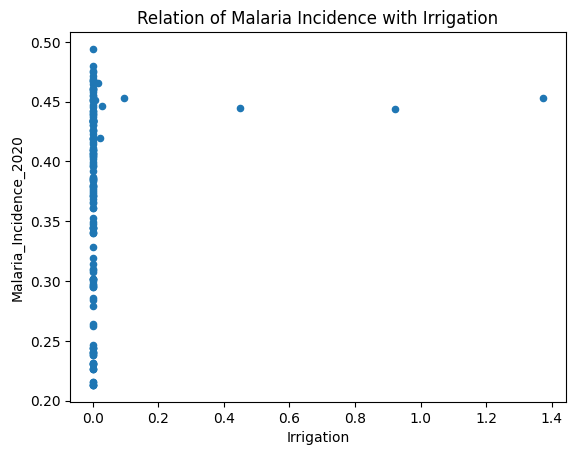

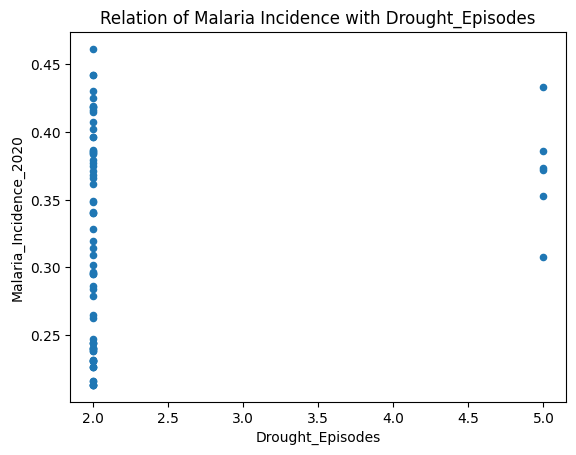

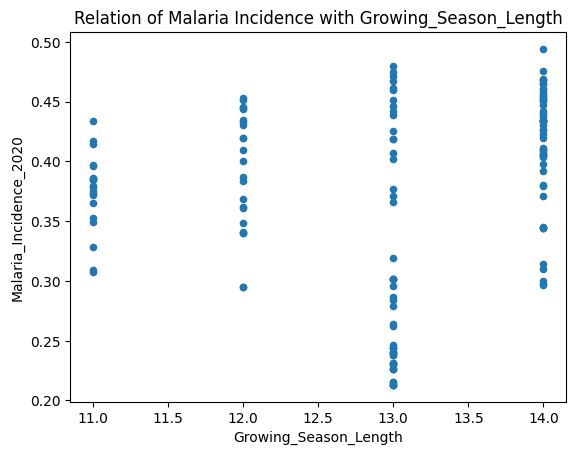

In [ ]:
# Create a DataFrame containing only the columns you want to plot
columns_to_check = ['Elevation', 'Global_Human_Footprint', 'Irrigation', 'Drought_Episodes', 'Growing_Season_Length']

# Create subplots
#fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(10, 8))
fig = plt.figure(figsize=(10,6))

# Iterate over columns_to_check and plot each variable in a subplot
for col in columns_to_check:
    #ax = axes[i] if num_rows > 1 else axes  # If only one row, axes[i] will return a single axis
    gdf_combined.plot.scatter(x=col,y='Malaria_Incidence_2020')
    plt.title(f"Relation of Malaria Incidence with {col}")  # Set subplot title

# Show plot
plt.show()


Text(0.5, 1.0, 'Relation between Malaria incidence and Mean temperature')

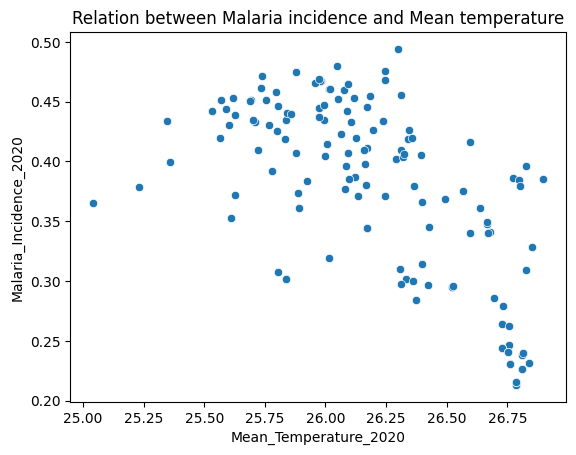

In [ ]:
sns.scatterplot(data = gdf_combined, x='Mean_Temperature_2020', y='Malaria_Incidence_2020')
plt.title("Relation between Malaria incidence and Mean temperature")

<Figure size 1000x600 with 0 Axes>

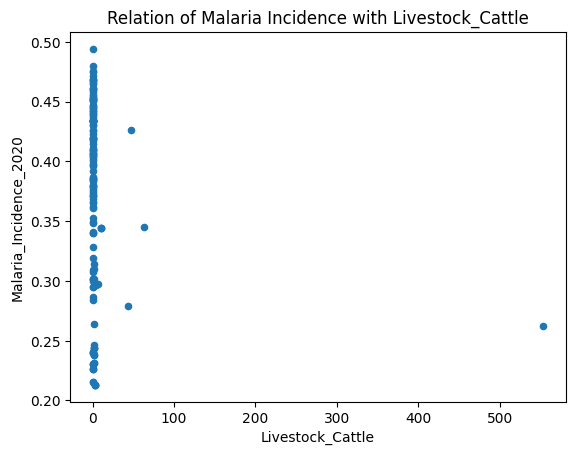

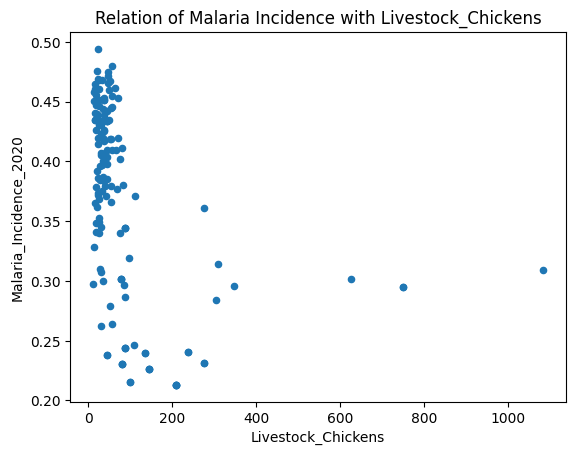

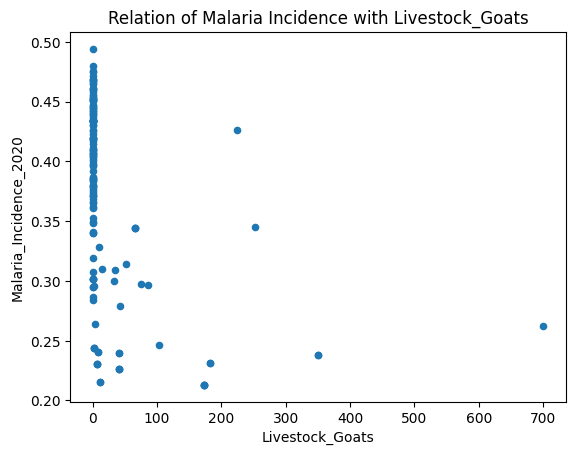

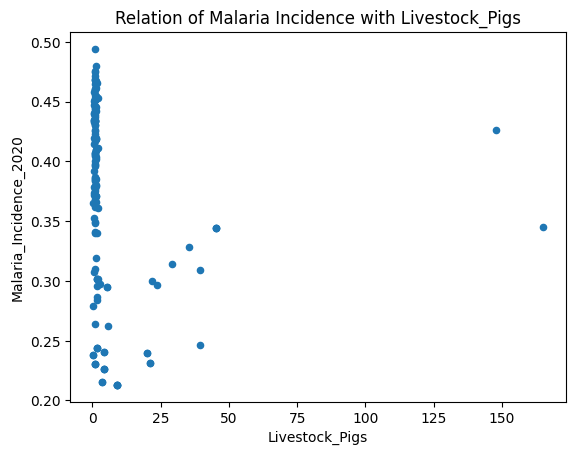

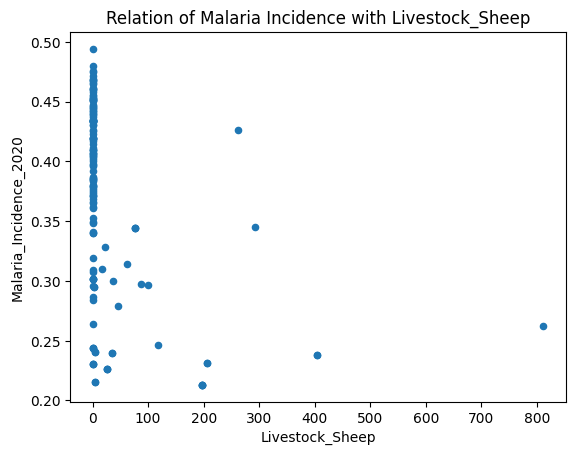

In [ ]:
fig = plt.figure(figsize=(10,6))

# Iterate over columns_to_check and plot each variable in a subplot
for col in livestock_columns[1:]:
    #ax = axes[i] if num_rows > 1 else axes  # If only one row, axes[i] will return a single axis
    gdf_combined.plot.scatter(x=col,y='Malaria_Incidence_2020')
    plt.title(f"Relation of Malaria Incidence with {col}")  # Set subplot title

# Show plot
plt.show()

The dataset represents the average monthly precipitation divided by average monthly potential evapotranspiration, an aridity index defined by the United Nations Environmental Programme (UNEP).

In [ ]:
columns_2020

['All_Population_Count_2020',
 'Aridity_2020',
 'Day_Land_Surface_Temp_2020',
 'Diurnal_Temperature_Range_2020',
 'Enhanced_Vegetation_Index_2020',
 'Frost_Days_2020',
 'ITN_Coverage_2020',
 'Land_Surface_Temperature_2020',
 'Malaria_Incidence_2020',
 'Malaria_Prevalence_2020',
 'Maximum_Temperature_2020',
 'Mean_Temperature_2020',
 'Minimum_Temperature_2020',
 'Night_Land_Surface_Temp_2020',
 'PET_2020',
 'Precipitation_2020',
 'Rainfall_2020',
 'U5_Population_2020',
 'UN_Population_Count_2020',
 'UN_Population_Density_2020',
 'Wet_Days_2020']

/usr/local/lib/python3.10/dist-packages/pandas/plotting/_matplotlib/core.py:512: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = self.plt.figure(figsize=self.figsize)


<Figure size 1000x600 with 0 Axes>

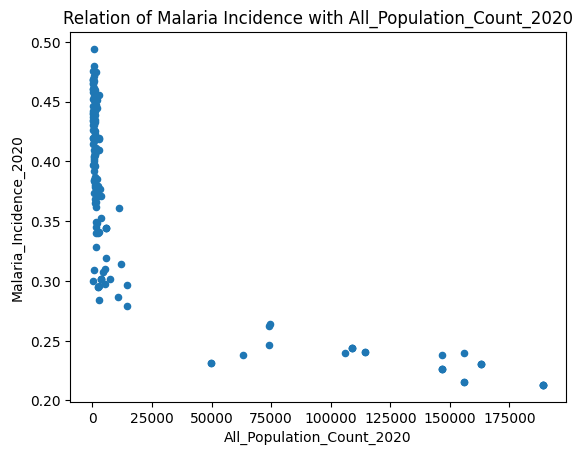

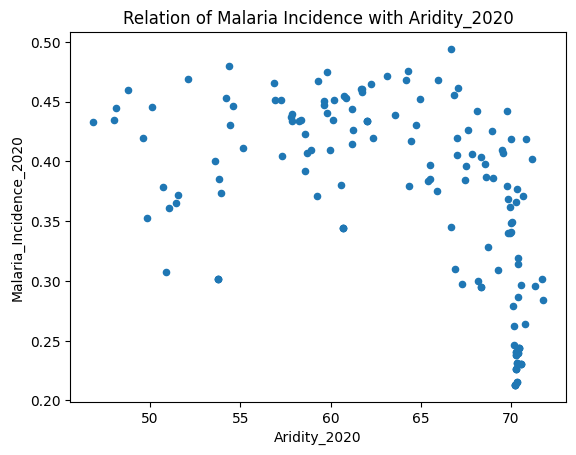

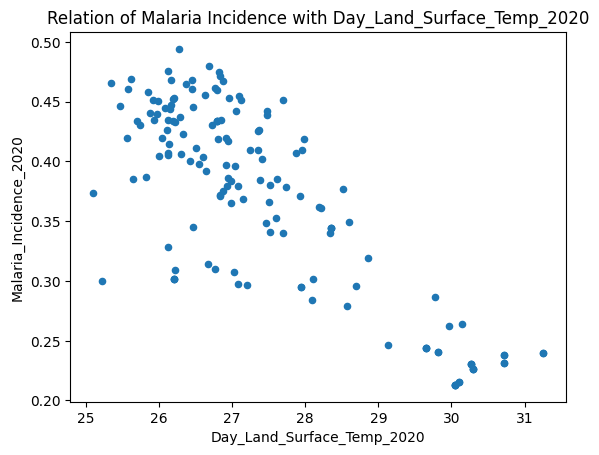

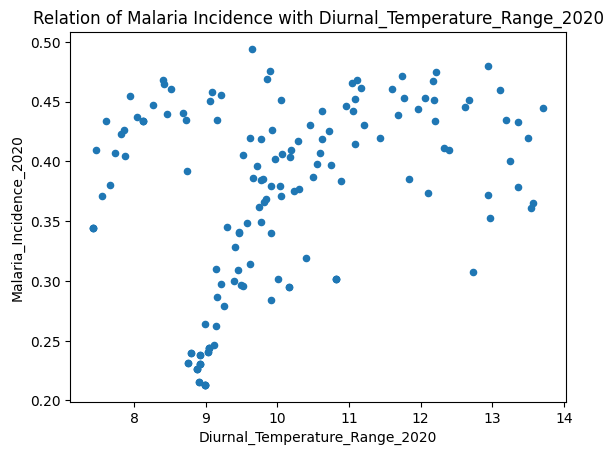

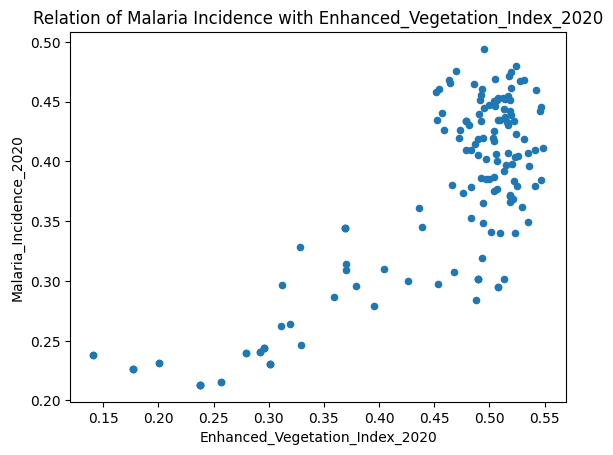

...

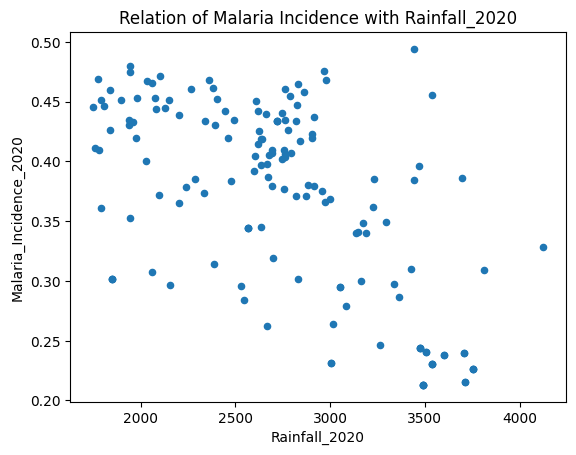

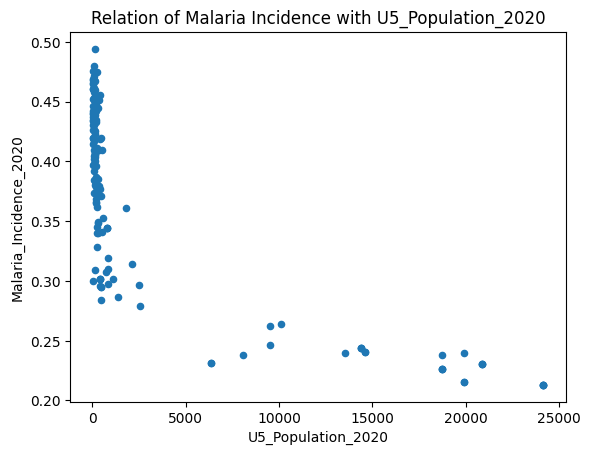

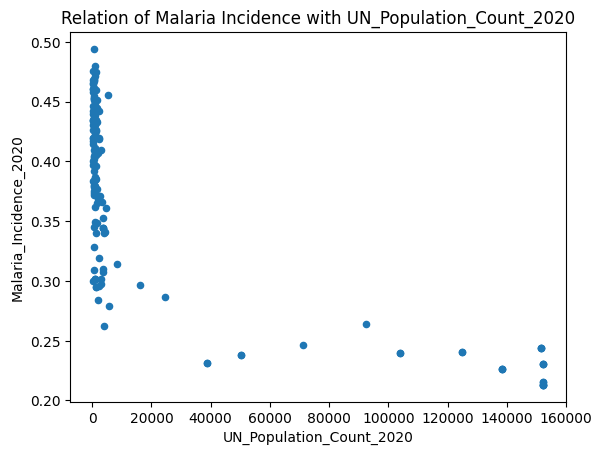

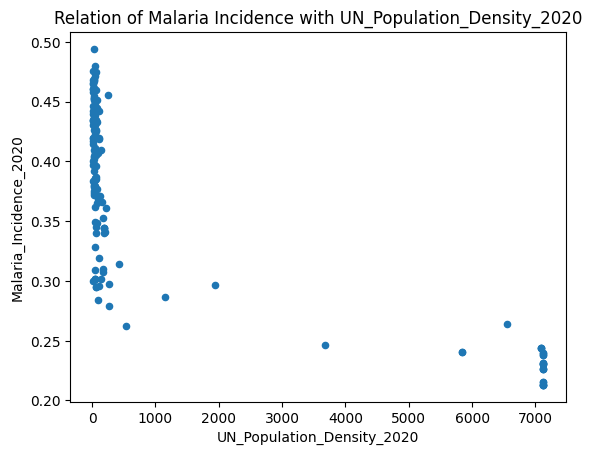

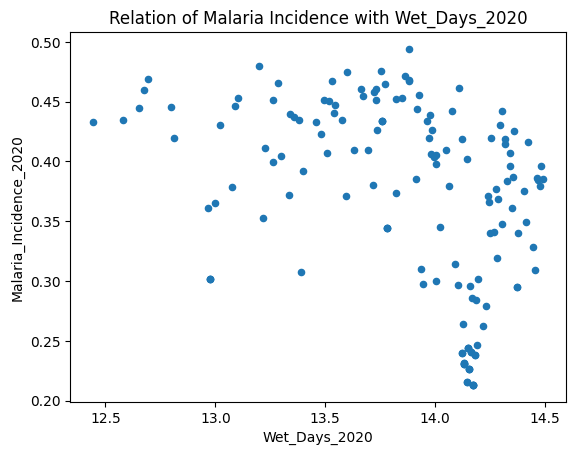

In [ ]:
fig = plt.figure(figsize=(10,6))

# Iterate over columns_to_check and plot each variable in a subplot
for col in columns_2020:
    #ax = axes[i] if num_rows > 1 else axes  # If only one row, axes[i] will return a single axis
    gdf_combined.plot.scatter(x=col,y='Malaria_Incidence_2020')
    plt.title(f"Relation of Malaria Incidence with {col}")  # Set subplot title

# Show plot
plt.show()

<Figure size 1000x600 with 0 Axes>

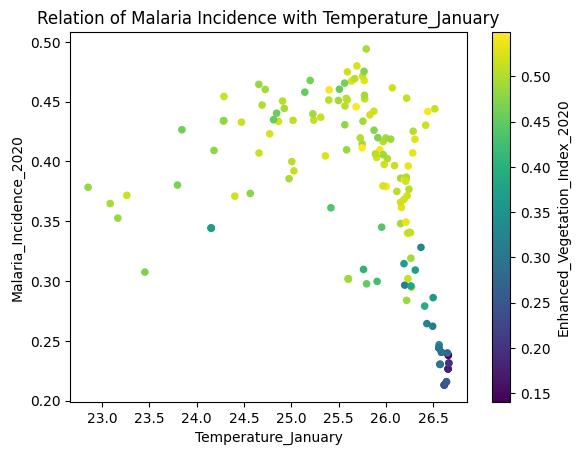

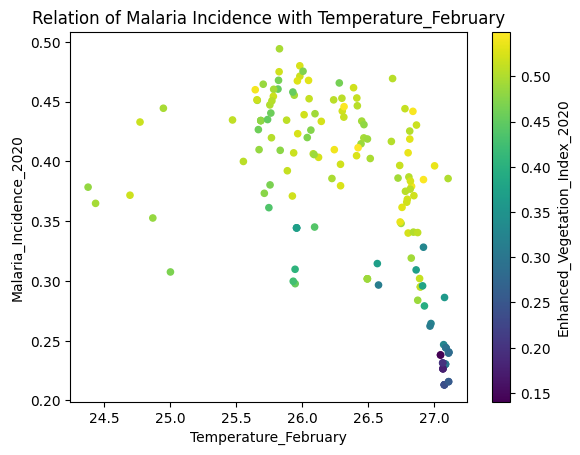

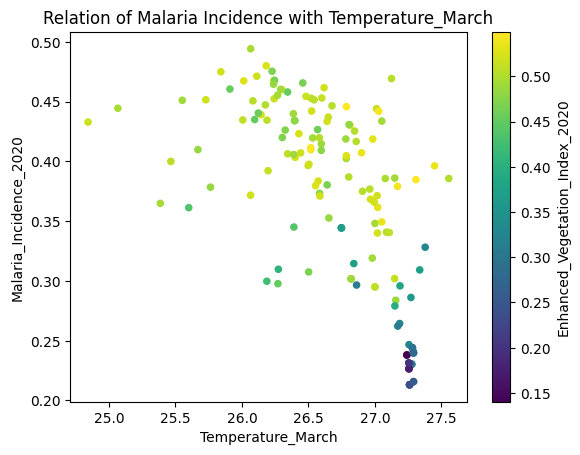

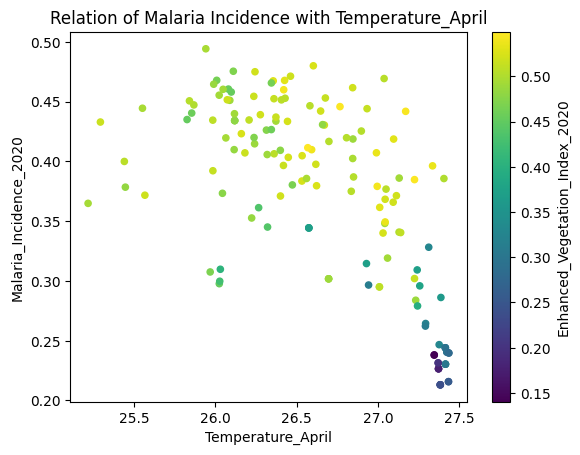

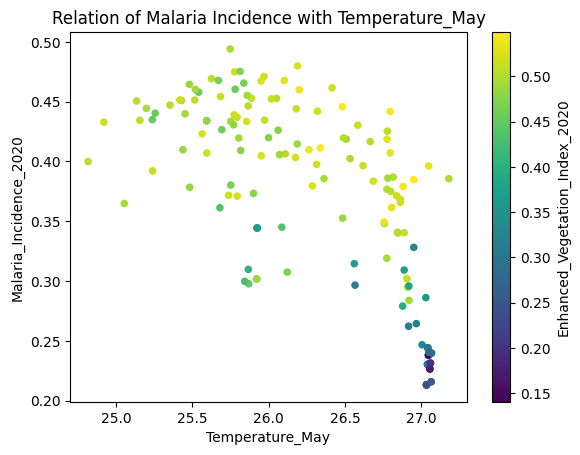

...

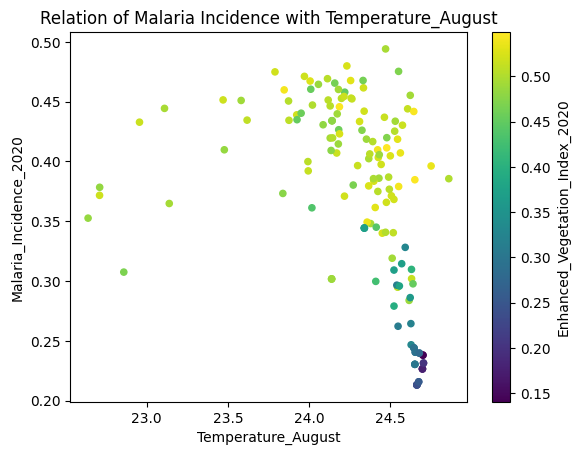

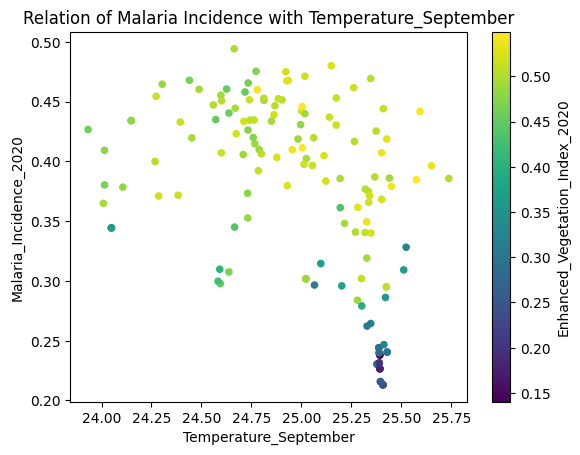

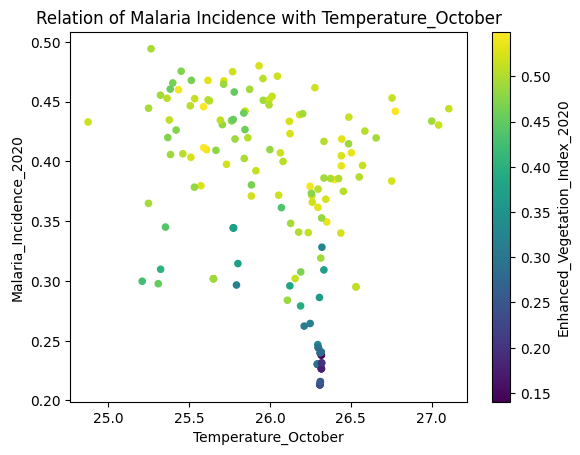

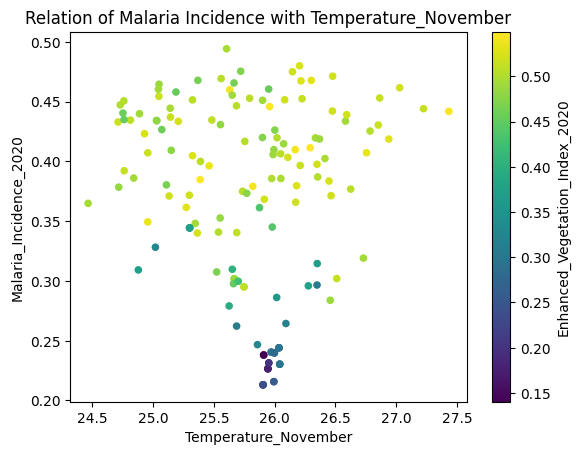

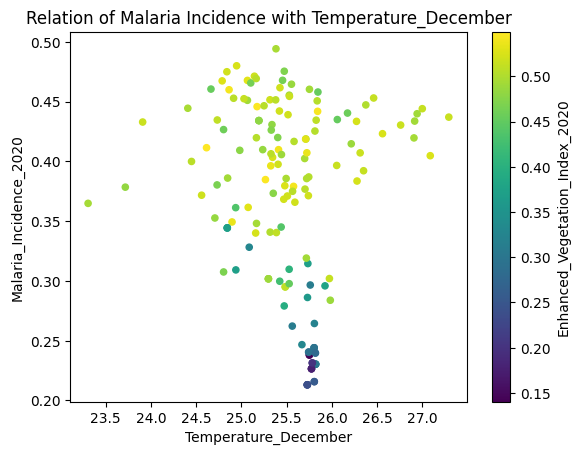

In [ ]:
fig = plt.figure(figsize=(10,6))

# Iterate over columns_to_check and plot each variable in a subplot
for col in month_temp_columns[1:]:
    #ax = axes[i] if num_rows > 1 else axes  # If only one row, axes[i] will return a single axis
    gdf_combined.plot.scatter(x=col,y='Malaria_Incidence_2020',c='Enhanced_Vegetation_Index_2020')
    plt.title(f"Relation of Malaria Incidence with {col}")  # Set subplot title

# Show plot
plt.show()

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [ ]:
columns_by_year['2020']

['All_Population_Count_2020',
 'Aridity_2020',
 'Day_Land_Surface_Temp_2020',
 'Diurnal_Temperature_Range_2020',
 'Enhanced_Vegetation_Index_2020',
 'Frost_Days_2020',
 'ITN_Coverage_2020',
 'Land_Surface_Temperature_2020',
 'Malaria_Incidence_2020',
 'Malaria_Prevalence_2020',
 'Maximum_Temperature_2020',
 'Mean_Temperature_2020',
 'Minimum_Temperature_2020',
 'Night_Land_Surface_Temp_2020',
 'PET_2020',
 'Precipitation_2020',
 'Rainfall_2020',
 'U5_Population_2020',
 'UN_Population_Count_2020',
 'UN_Population_Density_2020',
 'Wet_Days_2020']

In [ ]:
scaled_X = scaler.fit_transform(gdf_combined[columns_by_year['2020']])
scaled_X = pd.DataFrame(scaled_X, columns=columns_by_year['2020'])

In [ ]:
scaled_X

,All_Population_Count_2020,Aridity_2020,Day_Land_Surface_Temp_2020,Diurnal_Temperature_Range_2020,Enhanced_Vegetation_Index_2020,Frost_Days_2020,ITN_Coverage_2020,Land_Surface_Temperature_2020,Malaria_Incidence_2020,Malaria_Prevalence_2020,...,Mean_Temperature_2020,Minimum_Temperature_2020,Night_Land_Surface_Temp_2020,PET_2020,Precipitation_2020,Rainfall_2020,U5_Population_2020,UN_Population_Count_2020,UN_Population_Density_2020,Wet_Days_2020
0,0.975921,0.938532,1.125133,-0.591548,-1.178931,0.0,0.914294,1.039802,-1.533796,-1.441733,...,1.255907,0.927930,0.672561,0.322762,0.959701,0.907387,0.971888,1.040872,0.962382,0.705876
1,3.216006,0.948350,1.731110,-0.667911,-2.072377,0.0,1.061480,1.696018,-1.953124,-1.754376,...,1.324063,1.009777,1.260307,0.263676,0.940043,1.301185,3.204137,2.744844,2.320499,0.664903
2,3.216006,0.948350,1.731110,-0.667911,-2.072377,0.0,1.061480,1.696018,-1.953124,-1.754376,...,1.324063,1.009777,1.260307,0.263676,0.940043,1.301185,3.204137,2.744844,2.320499,0.664903
3,3.216006,0.948350,1.731110,-0.667911,-2.072377,0.0,1.061480,1.696018,-1.953124,-1.754376,...,1.324063,1.009777,1.260307,0.263676,0.940043,1.301185,3.204137,2.744844,2.320499,0.664903
4,2.391071,0.958231,1.899956,-0.744273,-2.673190,0.0,1.244521,2.122705,-1.785685,-1.626783,...,1.392220,1.091625,1.995715,0.204590,0.920384,1.763512,2.379923,2.450152,2.320499,0.623930
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,-0.459983,-0.588188,-1.040006,-0.867312,0.079560,0.0,-0.922662,-1.307015,0.886240,0.859857,...,-0.924547,0.273873,-1.432536,-1.419634,-1.090092,0.006967,-0.467279,-0.441929,-0.468339,-0.670957
146,-0.454647,-0.765446,-0.528500,-0.829548,0.633213,0.0,-0.787839,-0.821715,0.283446,0.166417,...,-1.068928,0.187980,-1.097269,-1.539091,-1.279088,-0.258776,-0.460628,-0.443906,-0.470064,-0.967597
147,-0.461440,-0.872769,-0.974526,-1.011097,0.415062,0.0,-1.057060,-0.829707,0.879270,0.845816,...,-0.879473,0.396115,-0.416301,-1.673961,-1.417243,-0.146442,-0.469095,-0.448016,-0.473654,-1.097800
148,-0.454596,-0.957752,-0.962067,-1.385702,0.764351,0.0,-0.560477,-0.490232,0.440582,0.337215,...,-0.550571,0.803123,0.359993,-1.853227,-1.554000,-0.240634,-0.460371,-0.443237,-0.469046,-1.178343


In [ ]:
from sklearn.ensemble import RandomForestRegressor

X = scaled_X.drop(columns=['Malaria_Incidence_2020','Malaria_Prevalence_2020'],axis=1)
y = scaled_X[['Malaria_Incidence_2020','Malaria_Prevalence_2020']]

model = RandomForestRegressor()
model.fit(X, y)

feature_importance = model.feature_importances_

In [ ]:
features = list(np.array(model.feature_names_in_))


In [ ]:
output = pd.DataFrame(data= feature_importance).transpose()

In [ ]:
column_rename_dict = dict(zip(output.columns, features))

In [ ]:
# Rename the columns of the DataFrame
output = output.rename(columns=column_rename_dict)

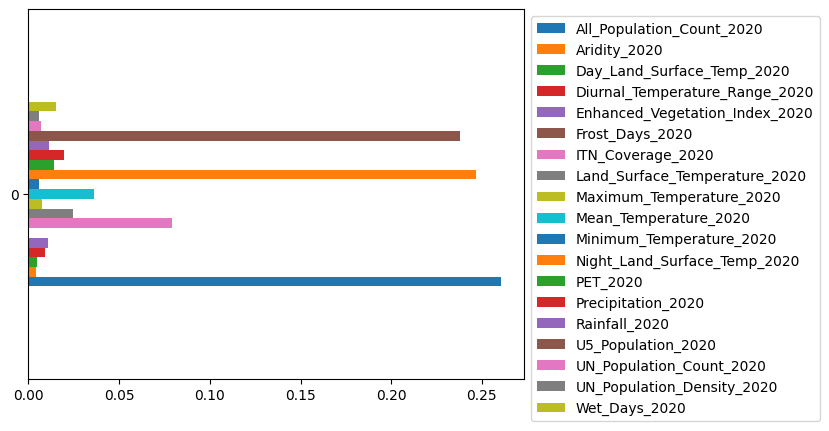

In [ ]:
ax = output.plot.barh()
ax.legend(bbox_to_anchor=(1,1))

In [ ]:
summary_stats = df.describe()
skewness = df.skew()
kurtosis = df.kurtosis()

<ipython-input-112-9d7fb7add29d>:2: FutureWarning: The default value of numeric_only in DataFrame.skew is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  skewness = df.skew()
<ipython-input-112-9d7fb7add29d>:3: FutureWarning: The default value of numeric_only in DataFrame.kurt is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  kurtosis = df.kurtosis()


In [ ]:
print("Summary Statistics:")
print(summary_stats)
print("\nSkewness:")
print(skewness)
print("\nKurtosis:")
print(kurtosis)

Summary Statistics:
       DHSYEAR    DHSCLUST  All_Population_Count_2000  \
count    150.0  150.000000                 150.000000   
mean    2022.0   75.500000               12554.011134   
std        0.0   43.445368               26379.289854   
min     2022.0    1.000000                  67.207802   
25%     2022.0   38.250000                 432.830124   
50%     2022.0   75.500000                 914.416840   
75%     2022.0  112.750000                3298.306641   
max     2022.0  150.000000               91106.500000   

       All_Population_Count_2005  All_Population_Count_2010  \
count                 150.000000                 150.000000   
mean                14855.138912               16930.897489   
std                 31335.615664               35401.271892   
min                    64.119164                  90.375465   
25%                   491.901031                 535.076584   
50%                   969.185425                1108.712891   
75%                  3397

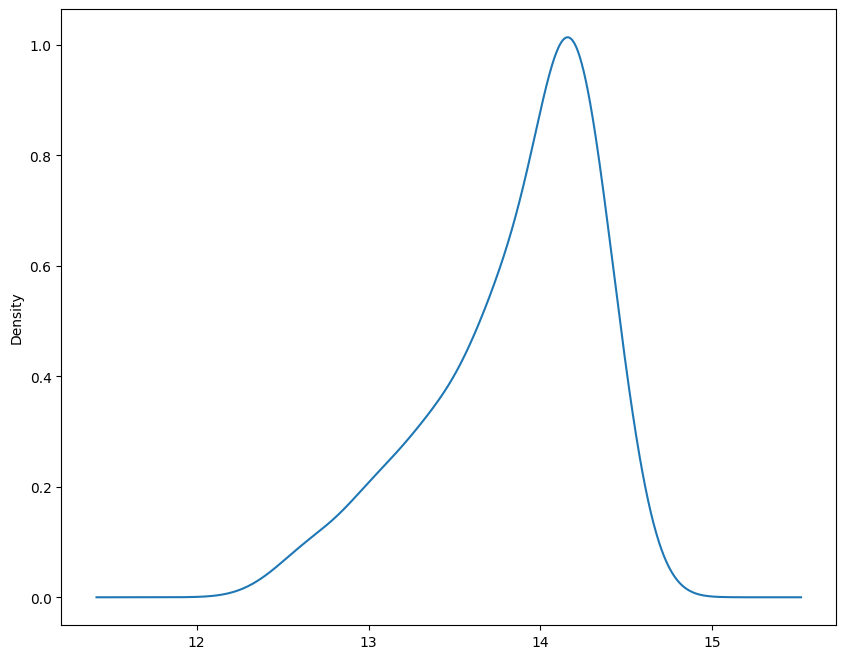

In [ ]:
df['Wet_Days_2020'].plot(kind='kde', figsize=(10, 8))
plt.show()